In [3]:
import torch 
import xarray as xr
import os
import matplotlib.pyplot as plt
import numpy as np

In [4]:
root="/r/scratch/users/mschillinger/data/cordexbench/"
domain="NZ"
training_experiment = 'Emulator_hist_future'
mode = "train" 
if mode == "train":
    folder = "train"
else:
    raise ValueError("In DownscalingDatasetNormed: mode not recognised")
        
if training_experiment == 'ESD_pseudo_reality':
    period_training = '1961-1980'
elif training_experiment == 'Emulator_hist_future':
    period_training = '1961-1980_2080-2099'
else:
    raise ValueError('Provide a valid date')

# Set the GCM
if domain == 'ALPS':
    gcm_name = 'CNRM-CM5'
elif domain == 'NZ' or domain == 'SA':
    gcm_name = 'ACCESS-CM2'
DATA_PATH = root + f"/{domain}/{domain}_domain"
hr_path = f'{DATA_PATH}/{folder}/{training_experiment}/target/pr_tasmax_{gcm_name}_{period_training}.nc'

In [5]:
hr_ds = xr.open_dataset(hr_path)
hr_ds

<xarray.Dataset> Size: 3GB
Dimensions:  (time: 14600, lat: 128, lon: 128)
Coordinates:
  * time     (time) datetime64[ns] 117kB 1961-01-01 1961-01-02 ... 2099-12-31
  * lon      (lon) float32 512B 166.0 166.1 166.3 166.4 ... 179.5 179.6 179.7
  * lat      (lat) float32 512B -47.56 -47.46 -47.35 ... -34.15 -34.04 -33.93
Data variables:
    pr       (time, lat, lon) float64 2GB ...
    tasmax   (time, lat, lon) float32 957MB ...
Attributes: (12/28)
    CDI:             Climate Data Interface version 1.9.5 (http://mpimet.mpg....
    history:         Tue Mar 12 14:54:26 2024: cdo merge /nesi/project/niwa00...
    source:          CSIRO conformal-cubic model. Input file: surf.ccam_12km....
    Conventions:     CF-1.7
    title:           CCAM simulation data
    il:              288
    ...              ...
    BC_version:      no output bias correction
    CMOR_v:          v1.0 Public
    CDO_call:        daymean computed on hourly data
    project:         NIWA CMIP6 Downscaling
    contact:         Peter Gibson (peter.gibson@niwa.co.nz)
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

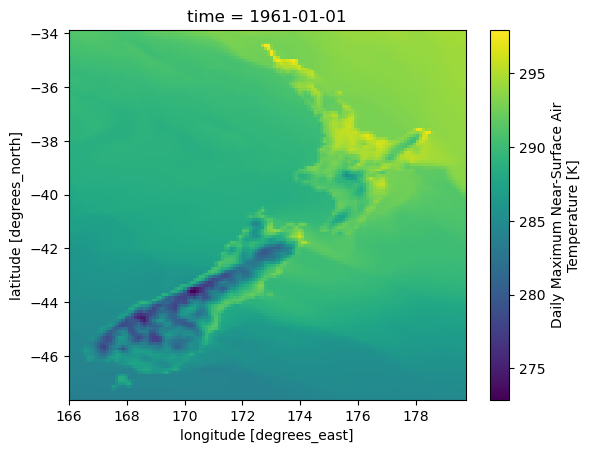

In [6]:
hr_ds.tasmax[0].plot()

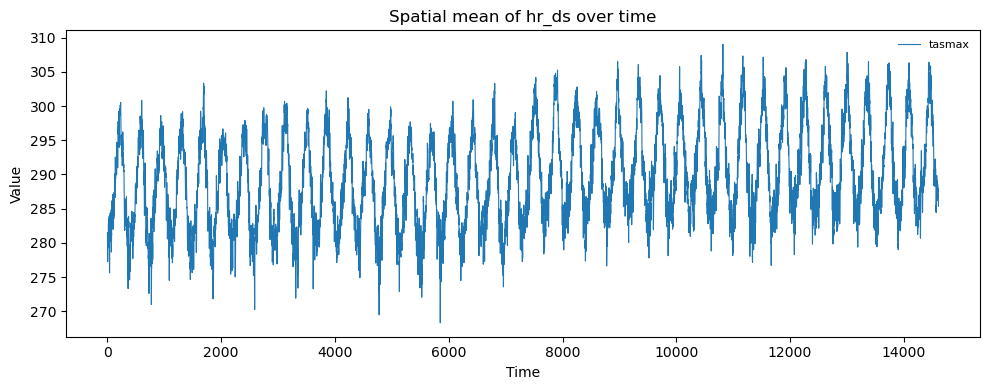

In [3]:
hr_ds = xr.open_dataset(hr_path)
# spatial mean over lat/lon for each variable and plot over time
#hr_mean = hr_ds.to_array().mean(dim=("lat", "lon"))
hr_mean = hr_ds.to_array().mean(dim=("y", "x"))
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(hr_mean["time"])), hr_mean.sel(variable="tasmax").values, label="tasmax", lw=0.8)
ax.set_title("Spatial mean of hr_ds over time")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

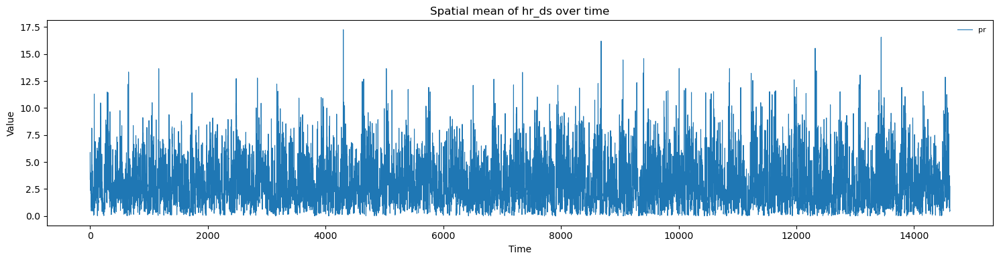

In [4]:
import numpy as np
hr_ds = xr.open_dataset(hr_path)
# spatial mean over lat/lon for each variable and plot over time
hr_mean = hr_ds.to_array().mean(dim=("y", "x"))
fig, ax = plt.subplots(figsize=(15, 4))
ax.plot(np.arange(len(hr_mean["time"])), hr_mean.sel(variable="pr").values, label="pr", lw=0.8)
ax.set_title("Spatial mean of hr_ds over time")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

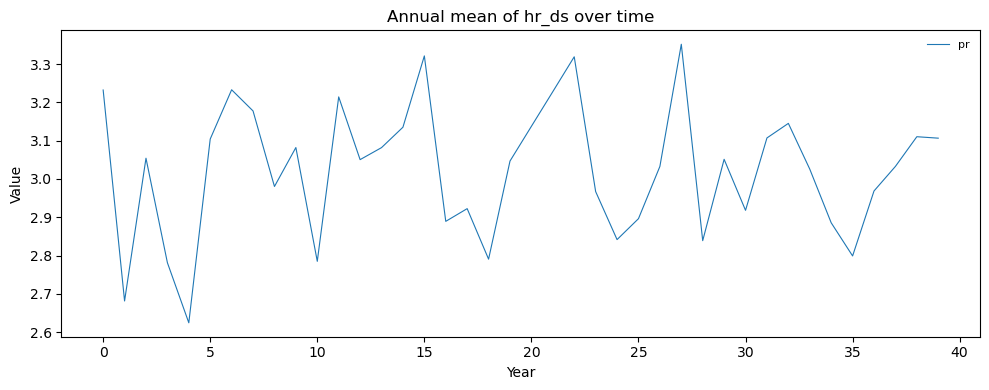

In [5]:
import numpy as np
hr_ds = xr.open_dataset(hr_path)
# spatial mean over lat/lon for each variable and plot over time
hr_mean = hr_ds.to_array().mean(dim=("y", "x"))
annual = hr_mean.groupby("time.year").mean("time")
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(annual["year"])), annual.sel(variable="pr").values, label="pr", lw=0.8)
ax.set_title("Annual mean of hr_ds over time")
ax.set_xlabel("Year")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

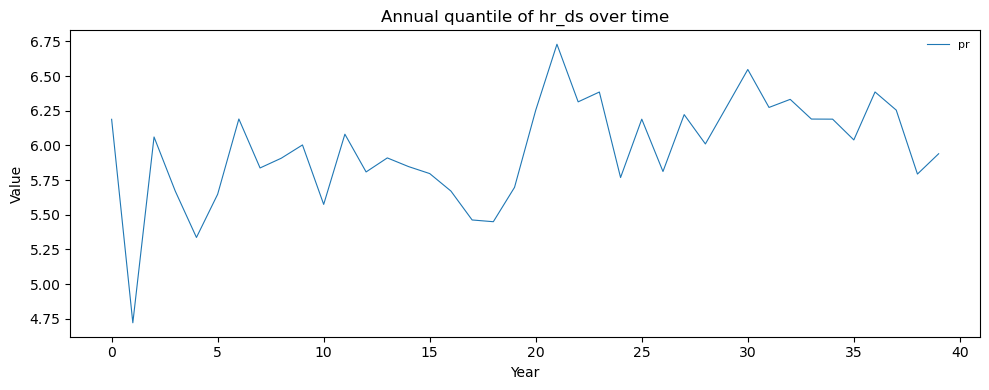

In [9]:
import numpy as np
hr_ds = xr.open_dataset(hr_path)
# spatial mean over lat/lon for each variable and plot over time
hr_mean = hr_ds.to_array().mean(dim=("y", "x"))
annual = hr_mean.groupby("time.year").quantile(0.9,"time")
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(annual["year"])), annual.sel(variable="pr").values, label="pr", lw=0.8)
ax.set_title("Annual quantile of hr_ds over time")
ax.set_xlabel("Year")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

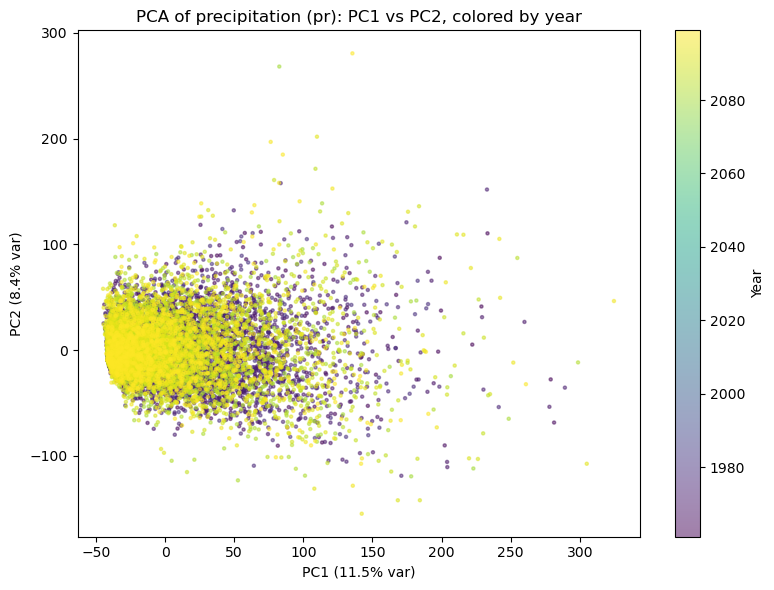

In [11]:
# PCA on precipitation (pr) and plot PC1 vs PC2 colored by year
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
da_pr = hr_ds["pr"].stack(feature=("y", "x")).transpose("time", "feature")
X_pr = da_pr.values

# Fill NaNs with feature means
feat_means_pr = np.nanmean(X_pr, axis=0)
nan_rows, nan_cols = np.where(np.isnan(X_pr))
if nan_rows.size:
    X_pr[nan_rows, nan_cols] = feat_means_pr[nan_cols]

# Standardize and PCA
X_pr_scaled = StandardScaler().fit_transform(X_pr)
pca_pr = PCA(n_components=5, random_state=0)
pcs_pr = pca_pr.fit_transform(X_pr_scaled)

years_pr = hr_ds["time"].dt.year.values

fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(pcs_pr[:, 0], pcs_pr[:, 3], c=years_pr, s=5, cmap="viridis", alpha=0.5)
ax.set_xlabel(f"PC1 ({pca_pr.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca_pr.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_title("PCA of precipitation (pr): PC1 vs PC2, colored by year")
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Year")
plt.tight_layout()

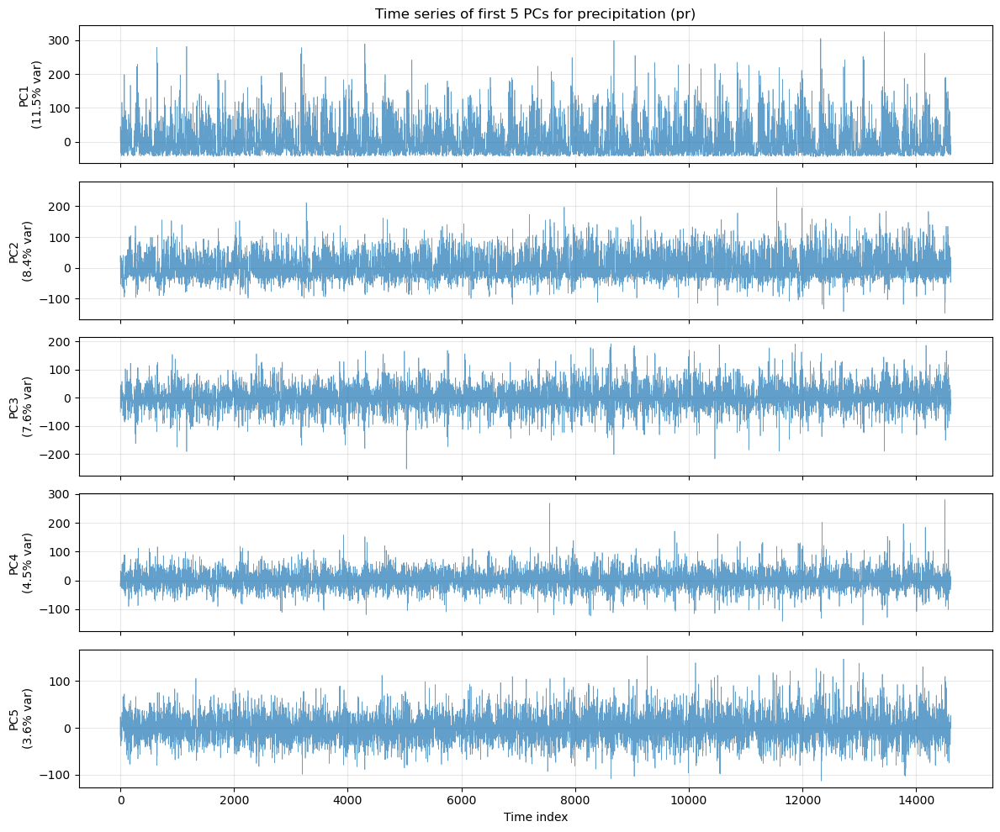

In [12]:
# PCA on precipitation (pr) and plot PC1 vs PC2 colored by year
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
da_pr = hr_ds["pr"].stack(feature=("y", "x")).transpose("time", "feature")
X_pr = da_pr.values

# Fill NaNs with feature means
feat_means_pr = np.nanmean(X_pr, axis=0)
nan_rows, nan_cols = np.where(np.isnan(X_pr))
if nan_rows.size:
    X_pr[nan_rows, nan_cols] = feat_means_pr[nan_cols]

# Standardize and PCA
X_pr_scaled = StandardScaler().fit_transform(X_pr)
pca_pr = PCA(n_components=5, random_state=0)
pcs_pr = pca_pr.fit_transform(X_pr_scaled)

years_pr = hr_ds["time"].dt.year.values

fig, axes = plt.subplots(5, 1, figsize=(12, 10), sharex=True)
for i in range(5):
    axes[i].plot(np.arange(len(pcs_pr)), pcs_pr[:, i], lw=0.5, alpha=0.7)
    axes[i].set_ylabel(f"PC{i+1}\n({pca_pr.explained_variance_ratio_[i]*100:.1f}% var)")
    axes[i].grid(alpha=0.3)
axes[-1].set_xlabel("Time index")
axes[0].set_title("Time series of first 5 PCs for precipitation (pr)")
plt.tight_layout()

In [3]:
lr_path = f'{DATA_PATH}/{folder}/{training_experiment}/predictors/{gcm_name}_{period_training}.nc'
lr_ds = xr.open_dataset(lr_path).astype("float32")
lr_ds

<xarray.Dataset> Size: 225MB
Dimensions:  (time: 14610, lat: 16, lon: 16)
Coordinates:
  * time     (time) datetime64[ns] 117kB 1961-01-01T12:00:00 ... 2099-12-31T1...
  * lon      (lon) float64 128B -4.0 -2.0 0.0 2.0 4.0 ... 20.0 22.0 24.0 26.0
  * lat      (lat) float64 128B 32.0 34.0 36.0 38.0 40.0 ... 56.0 58.0 60.0 62.0
Data variables: (12/15)
    u_850    (time, lat, lon) float32 15MB 5.404 5.786 5.58 ... -6.233 -6.644
    u_700    (time, lat, lon) float32 15MB 8.109 8.254 8.038 ... -1.614 -3.902
    u_500    (time, lat, lon) float32 15MB 12.04 12.14 12.07 ... 10.8 4.837
    v_850    (time, lat, lon) float32 15MB 1.269 1.057 0.62 ... 2.236 -0.7769
    v_700    (time, lat, lon) float32 15MB -3.097 -2.035 -0.55 ... -3.979 -2.639
    v_500    (time, lat, lon) float32 15MB -1.308 -0.2567 ... -18.53 -12.14
    ...       ...
    t_850    (time, lat, lon) float32 15MB 275.9 274.6 274.4 ... 259.2 258.4
    t_700    (time, lat, lon) float32 15MB 267.5 267.7 268.2 ... 253.5 252.0
    t_500    (time, lat, lon) float32 15MB 250.0 250.0 250.1 ... 240.4 238.0
    z_850    (time, lat, lon) float32 15MB 1.52e+03 1.519e+03 ... 1.439e+03
    z_700    (time, lat, lon) float32 15MB 3.066e+03 3.064e+03 ... 2.891e+03
    z_500    (time, lat, lon) float32 15MB 5.622e+03 5.622e+03 ... 5.306e+03
Attributes: (12/28)
    CDI:                            Climate Data Interface version 2.4.4 (htt...
    Conventions:                    CF-1.6
    institution:                    CNRM (Centre National de Recherches Meteo...
    description:                    Created by xios
    title:                          Created by xios
    creation_date:                  2020-03-01T12:29:46Z
    ...                             ...
    driving_experiment_comment:     Known issue correction: this simulation (...
    frequency:                      day
    tracking_id:                    hdl:21.14103/73d0f2aa-dfec-4e02-955f-b707...
    comment:                        CORDEX Europe EUR-11 CNRM-ALADIN 6.3 L91 ...
    history:                        Fri Jun 27 04:41:41 2025: cdo remap,/gpfs...
    CDO:                            Climate Data Operators version 2.4.4 (htt...

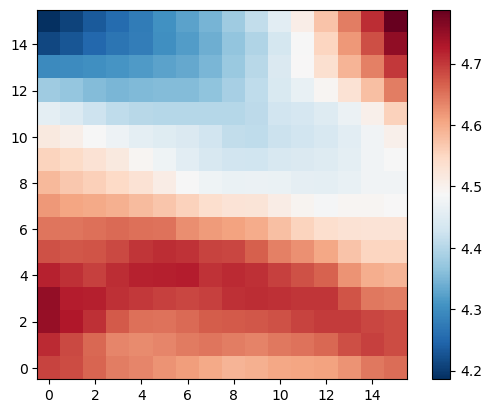

In [4]:
mid = lr_ds["time"].size // 2
plt.imshow(lr_ds["t_500"].values[mid:].mean(axis=(0)) - lr_ds["t_500"].values[:mid].mean(axis=(0)), cmap="RdBu_r",origin="lower");
plt.colorbar()

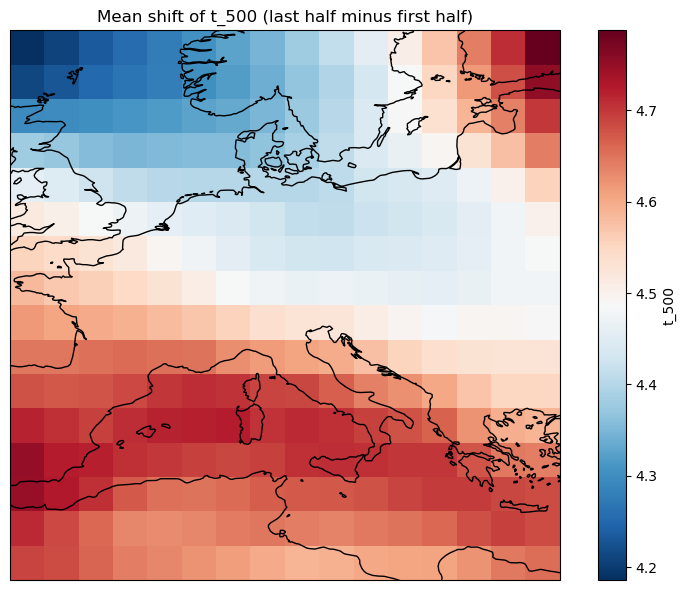

In [8]:
mid = lr_ds["time"].size // 2
import cartopy.crs as ccrs

# Mean shift (last half minus first half) using xarray
diff = lr_ds["t_500"].isel(time=slice(mid, None)).mean("time") - lr_ds["t_500"].isel(time=slice(None, mid)).mean("time")

fig = plt.figure(figsize=(8, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
diff.plot(ax=ax, transform=ccrs.PlateCarree(), cmap="RdBu_r")
ax.coastlines()
ax.set_title("Mean shift of t_500 (last half minus first half)")
plt.tight_layout()

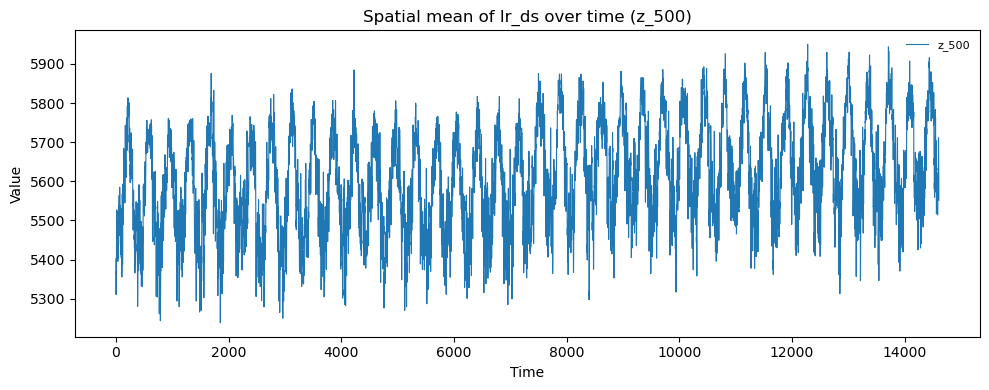

In [9]:
# spatial mean over lat/lon for each variable and plot over time
lr_mean = lr_ds.to_array().mean(dim=("lat", "lon"))
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(lr_mean["time"])), lr_mean.sel(variable="z_500").values, label="z_500", lw=0.8)
ax.set_title("Spatial mean of lr_ds over time (z_500)")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

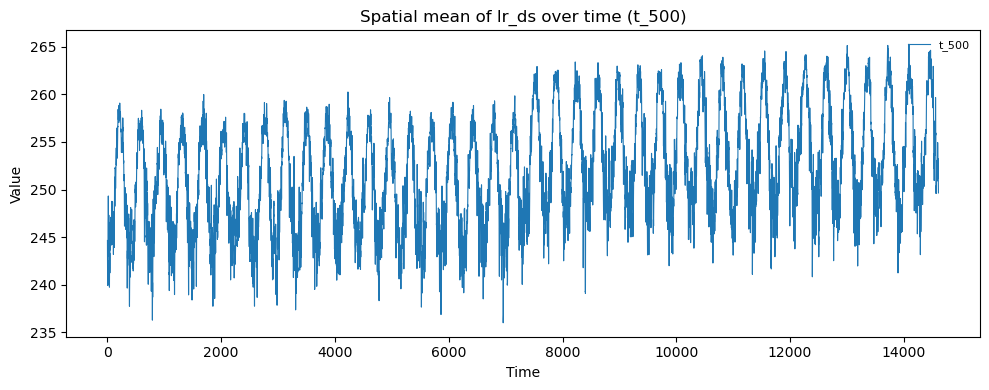

In [5]:
# spatial mean over lat/lon for each variable and plot over time
lr_mean = lr_ds.to_array().mean(dim=("lat", "lon"))
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(lr_mean["time"])), lr_mean.sel(variable="t_500").values, label="t_500", lw=0.8)
ax.set_title("Spatial mean of lr_ds over time (t_500)")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

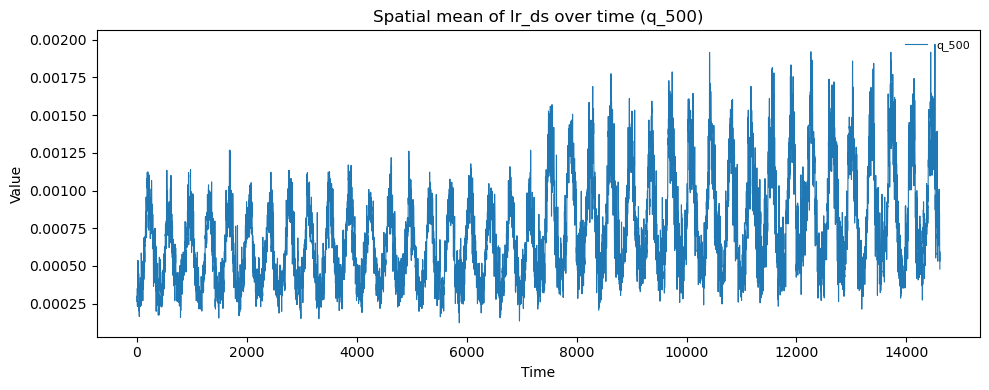

In [6]:
# spatial mean over lat/lon for each variable and plot over time
lr_mean = lr_ds.to_array().mean(dim=("lat", "lon"))
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(lr_mean["time"])), lr_mean.sel(variable="q_500").values, label="q_500", lw=0.8)
ax.set_title("Spatial mean of lr_ds over time (q_500)")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

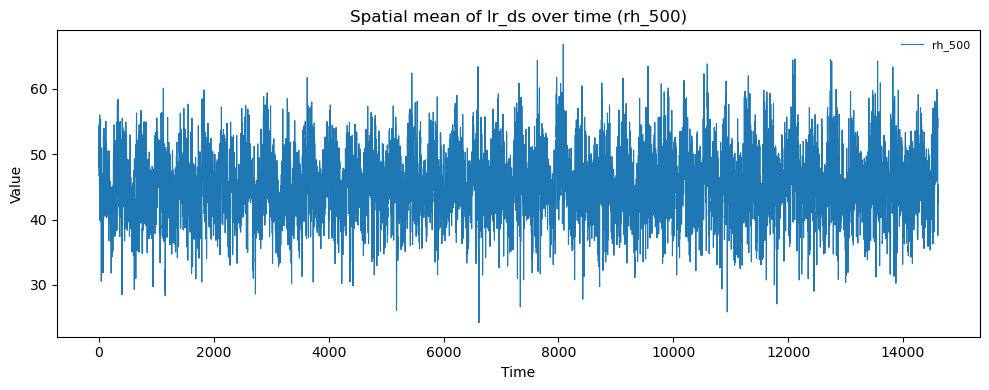

In [25]:
import numpy as np

# Constants
P = 500.0  # Pressure in hPa
epsilon = 0.622  # Ratio of molecular weight of water vapor to dry air

# 1. Calculate Actual Vapor Pressure (e) in hPa
# Formula: e = (q * P) / (epsilon + (1 - epsilon) * q)
# Since q is very small, the approximation e = (q * P) / epsilon is often used
lr_ds['e'] = (lr_ds['q_500'] * P) / (epsilon + (1 - epsilon) * lr_ds['q_500'])

# 2. Convert Temperature to Celsius (if it's in Kelvin)
# Check your metadata; if it's already Celsius, skip the -273.15
t_celsius = lr_ds['t_500'] - 273.15

# 3. Calculate Saturation Vapor Pressure (es) in hPa 
# Using the Magnus-Tetens formula
lr_ds['es'] = 6.112 * np.exp((17.67 * t_celsius) / (t_celsius + 243.5))
# 4. Calculate Relative Humidity (%)
lr_ds['rh_500'] = (lr_ds['e'] / lr_ds['es']) * 100

# Clip values to [0, 100] in case of numerical artifacts or supersaturation
# lr_ds['rh_500'] = lr_ds['rh_500'].clip(0, 100)

# Optional: Clean up intermediate variables
lr_ds = lr_ds.drop_vars(['e', 'es'])

# Plotting the result
lr_mean = lr_ds.to_array().mean(dim=("lat", "lon"))
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(lr_mean["time"])), lr_mean.sel(variable="rh_500").values, label="rh_500", lw=0.8)
ax.set_title("Spatial mean of lr_ds over time (rh_500)")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

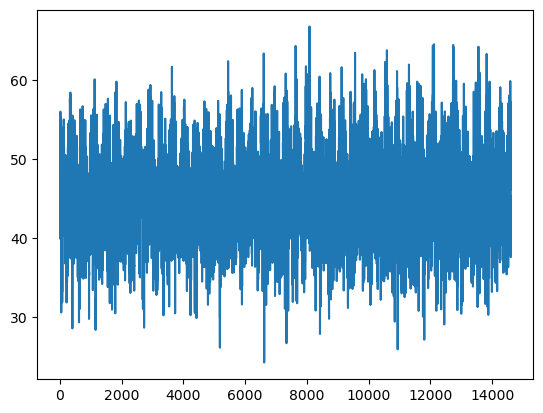

In [26]:
import numpy as np

def relative_humidity_from_q(q, T, p):
    """
    Compute relative humidity from specific humidity.

    Parameters
    ----------
    q : array-like
        Specific humidity [kg/kg]
    T : array-like
        Air temperature [K]
    p : array-like
        Air pressure [Pa]

    Returns
    -------
    RH : array-like
        Relative humidity [0–1]
    """

    # vapor pressure [Pa]
    e = (q * p) / (0.622 + 0.378 * q)

    # saturation vapor pressure over liquid water [Pa]
    es = 611.2 * np.exp(17.67 * (T - 273.15) / (T - 29.65))

    RH = e / es * 100
    return RH

plt.plot(relative_humidity_from_q(lr_ds['q_500'].values, lr_ds['t_500'].values, 50000).mean(axis=(1,2)))

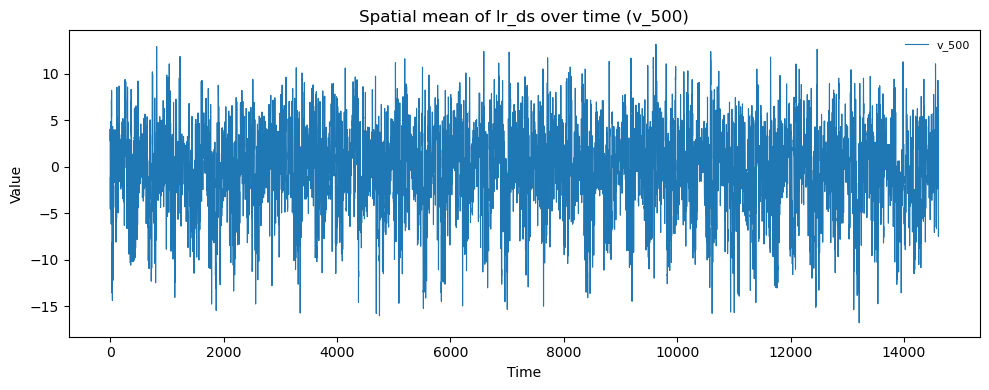

In [12]:
# spatial mean over lat/lon for each variable and plot over time
lr_mean = lr_ds.to_array().mean(dim=("lat", "lon"))
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(lr_mean["time"])), lr_mean.sel(variable="v_500").values, label="v_500", lw=0.8)
ax.set_title("Spatial mean of lr_ds over time (v_500)")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

In [29]:
ls_imperf = xr.open_dataset(
    "/r/scratch/users/mschillinger/data/cordexbench/ALPS/ALPS_domain/test/end_century/predictors/imperfect/MPI-ESM-LR_2080-2099.nc"
)

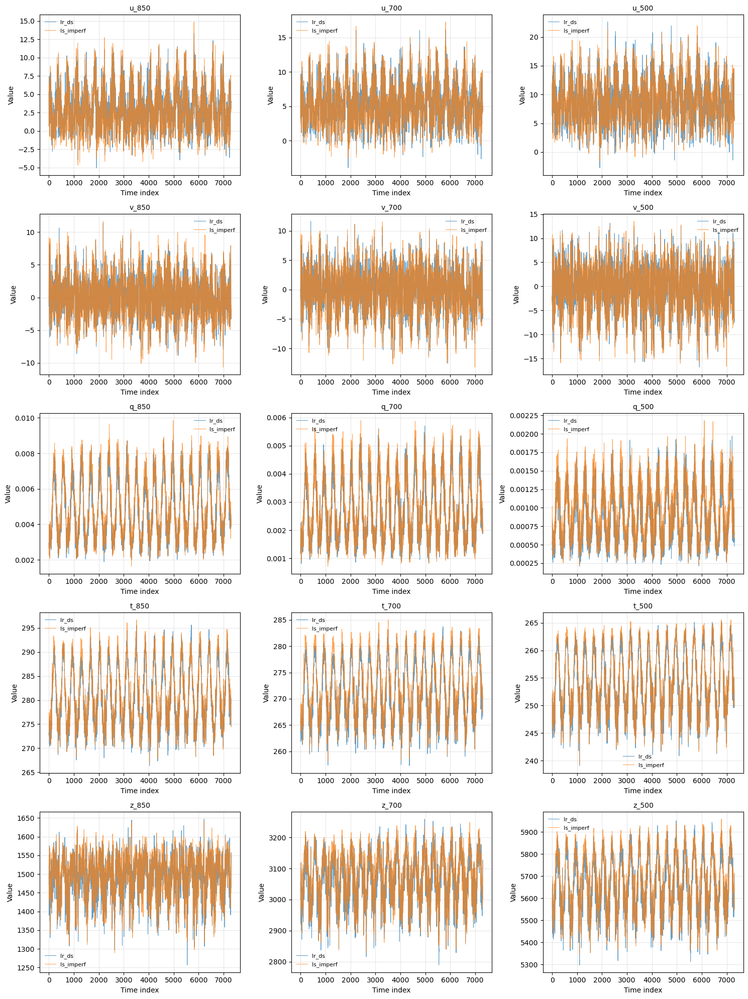

In [30]:
# Get all variables
variables = list(lr_ds.data_vars)

# Create subplots for each variable
n_vars = len(variables)
n_cols = 3
n_rows = (n_vars + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4*n_rows))
axes = axes.flatten()

# Plot second half of lr_mean and ls_imperf_mean for each variable
for i, var in enumerate(variables):
    ax = axes[i]
    ax.plot(np.arange(len(lr_mean["time"]) - mid), lr_mean.sel(variable=var).values[mid:], 
            label="lr_ds", lw=0.8, alpha=0.7)
    ax.plot(np.arange(len(ls_imperf_mean["time"])), ls_imperf_mean.sel(variable=var).values, 
            label="ls_imperf", lw=0.8, alpha=0.7)
    ax.set_title(f"{var}", fontsize=10)
    ax.set_xlabel("Time index")
    ax.set_ylabel("Value")
    ax.legend(fontsize=8, frameon=False)
    ax.grid(alpha=0.3)

# Hide unused subplots
for i in range(n_vars, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()

In [31]:
ls_imperf

<xarray.Dataset> Size: 112MB
Dimensions:  (time: 7305, lat: 16, lon: 16)
Coordinates:
  * time     (time) datetime64[ns] 58kB 2080-01-01T12:00:00 ... 2099-12-31T12...
  * lat      (lat) float64 128B 32.0 34.0 36.0 38.0 40.0 ... 56.0 58.0 60.0 62.0
  * lon      (lon) float64 128B -4.0 -2.0 0.0 2.0 4.0 ... 20.0 22.0 24.0 26.0
Data variables: (12/15)
    u_850    (time, lat, lon) float32 7MB ...
    u_700    (time, lat, lon) float32 7MB ...
    u_500    (time, lat, lon) float32 7MB ...
    v_850    (time, lat, lon) float32 7MB ...
    v_700    (time, lat, lon) float32 7MB ...
    v_500    (time, lat, lon) float32 7MB ...
    ...       ...
    z_850    (time, lat, lon) float32 7MB ...
    z_700    (time, lat, lon) float32 7MB ...
    z_500    (time, lat, lon) float32 7MB ...
    q_850    (time, lat, lon) float32 7MB ...
    q_700    (time, lat, lon) float32 7MB ...
    q_500    (time, lat, lon) float32 7MB ...
Attributes:
    regrid_method:  conservative

/tmp/ipykernel_3722880/462641970.py:40: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(pcs[:, 0], pcs[:, 2], s=5, cmap="viridis", alpha=0.5, label="perfect")
/tmp/ipykernel_3722880/462641970.py:41: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(pcs_imperf[:, 0], pcs_imperf[:, 2], s=5, cmap="plasma", alpha=0.5, label="imperfect")


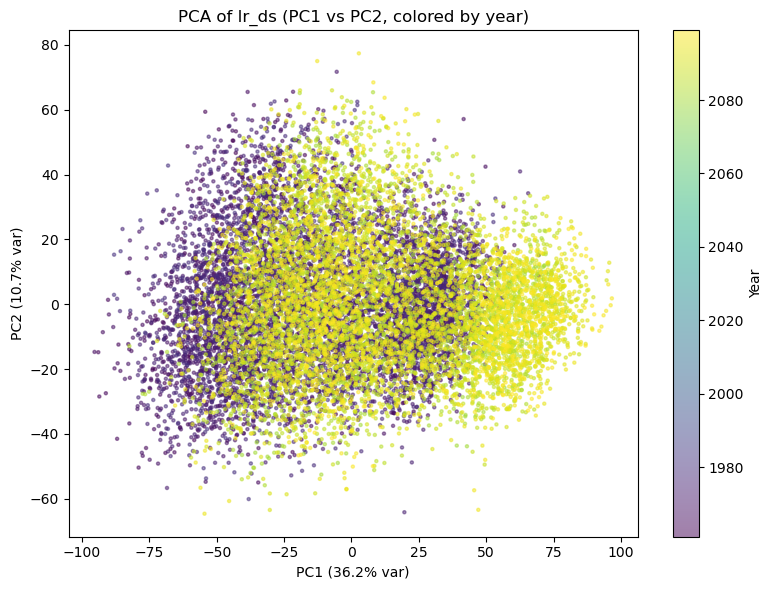

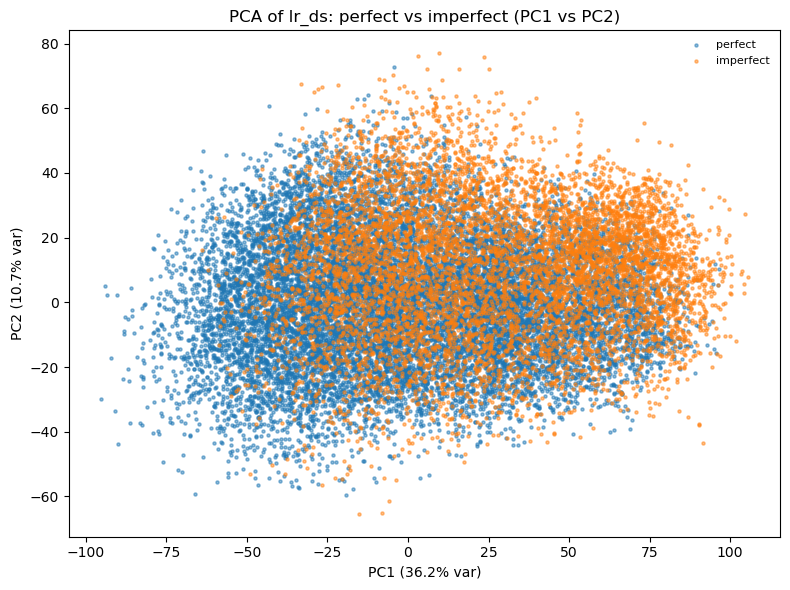

In [33]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Stack variables and spatial dims into features: (time, feature)
v_list = sorted(list(lr_ds.data_vars))
da = lr_ds[v_list].to_array().stack(feature=("variable", "lat", "lon")).transpose("time", "feature")
X = da.values  # shape: (n_time, n_features)

# Fill NaNs with feature means
feat_means = np.nanmean(X, axis=0)
nan_rows, nan_cols = np.where(np.isnan(X))
X[nan_rows, nan_cols] = feat_means[nan_cols]

# Standardize features and run PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA(n_components=5, random_state=0)
pcs = pca.fit_transform(X_scaled)

# Color by year
years = lr_ds["time"].dt.year.values
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(pcs[:, 0], pcs[:, 1], c=years, s=5, cmap="viridis", alpha=0.5)
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_title("PCA of lr_ds (PC1 vs PC2, colored by year)")
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Year")
plt.tight_layout()

# Plot first and third PC
X_imperf = ls_imperf[v_list].to_array().stack(feature=("variable", "lat", "lon")).transpose("time", "feature").values
X_imperf_scaled = scaler.transform(X_imperf)
pcs_imperf = pca.transform(X_imperf_scaled)

years_imperf = ls_imperf["time"].dt.year.values

fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(pcs[:, 0], pcs[:, 2], s=5, cmap="viridis", alpha=0.5, label="perfect")
ax.scatter(pcs_imperf[:, 0], pcs_imperf[:, 2], s=5, cmap="plasma", alpha=0.5, label="imperfect")
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_title("PCA of lr_ds: perfect vs imperfect (PC1 vs PC2)")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

In [24]:
np.where(np.isnan(X_imperf))

(array([], dtype=int64), array([], dtype=int64))

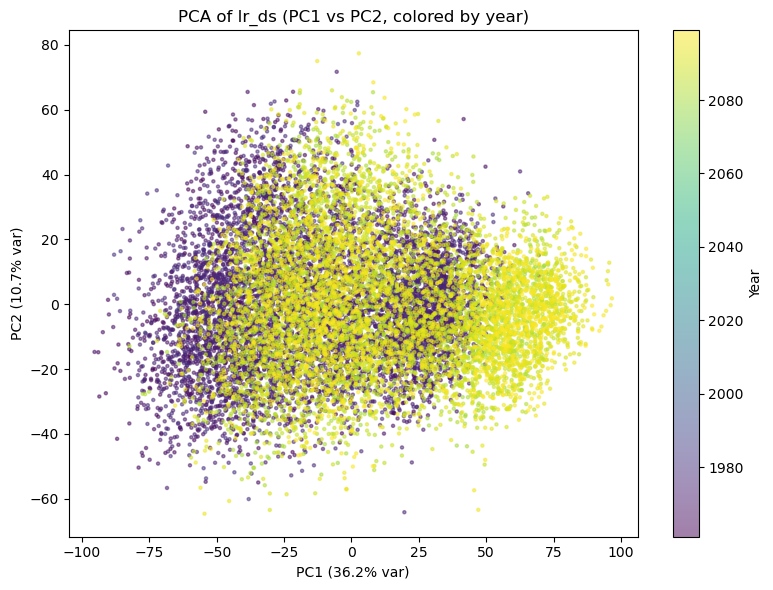

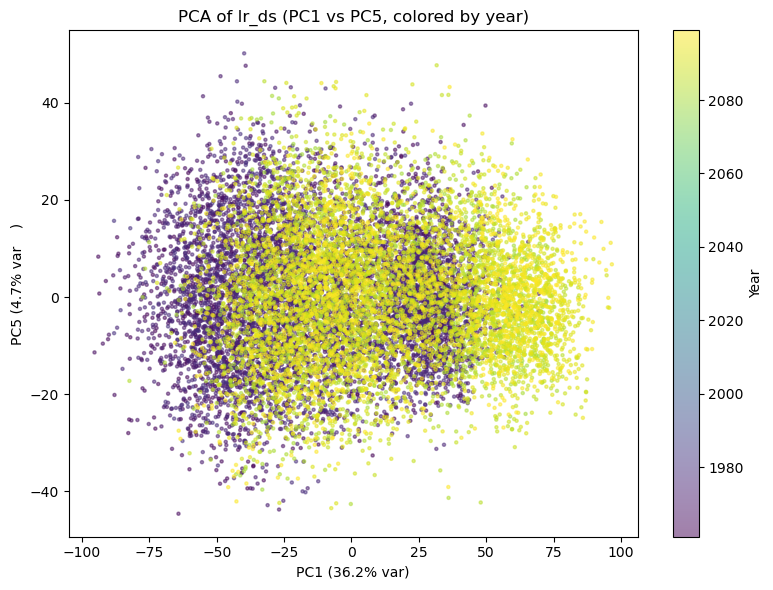

In [8]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Stack variables and spatial dims into features: (time, feature)
da = lr_ds.to_array().stack(feature=("variable", "lat", "lon")).transpose("time", "feature")
X = da.values  # shape: (n_time, n_features)

# Fill NaNs with feature means
feat_means = np.nanmean(X, axis=0)
nan_rows, nan_cols = np.where(np.isnan(X))
X[nan_rows, nan_cols] = feat_means[nan_cols]

# Standardize features and run PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA(n_components=5, random_state=0)
pcs = pca.fit_transform(X_scaled)

# Color by year
years = lr_ds["time"].dt.year.values
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(pcs[:, 0], pcs[:, 1], c=years, s=5, cmap="viridis", alpha=0.5)
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_title("PCA of lr_ds (PC1 vs PC2, colored by year)")
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Year")
plt.tight_layout()

# Plot first and third PC
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(pcs[:, 0], pcs[:, 4], c=years, s=5, cmap="viridis", alpha=0.5)
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC5 ({pca.explained_variance_ratio_[4]*100:.1f}% var    )")
ax.set_title("PCA of lr_ds (PC1 vs PC5, colored by year)")
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Year")
plt.tight_layout()

In [35]:
is_past = years < 2025  
is_future = years >= 2025

# 1. Calculate the mean shift vector in PC space (using your 10 PCs)
# Result is a vector of length 10
shift_pc = pcs[is_future].mean(axis=0) - pcs[is_past].mean(axis=0)

# 2. Map this 10-element shift back to the "Scaled Feature" space (shape: n_features)
# We use pca.components_ to project the shift back
shift_scaled = shift_pc @ pca.components_

# 3. Map the scaled shift back to original units
# IMPORTANT: We only multiply by the standard deviation. 
# We don't add the mean because we are transforming a DIFFERENCE, not a point.
shift_original_units = shift_scaled * scaler.scale_

# 4. Reshape the shift back to the spatial grid (variable, lat, lon)
# This creates a "Correction Map"
da_shift = xr.DataArray(
    shift_original_units, 
    coords=da.feature.coords, 
    dims="feature"
).unstack("feature")

# 5. Apply the correction to the original future dataset
# Subtract the climate shift from the future period
ds_future_corrected = lr_ds.sel(time=is_future) - da_shift.to_dataset(dim="variable")

# Combine back with the original past data
ds_final = xr.concat([lr_ds.sel(time=is_past), ds_future_corrected], dim="time")

In [39]:
shift_pc

array([26.073814 , -0.3742783,  3.2647758, -7.052414 ,  0.0428374],
      dtype=float32)

In [38]:
ds_final.to_netcdf(f'{root}/{domain}/norm_stats/{training_experiment}_{gcm_name}_{period_training}_no-climate-change-trend.nc')

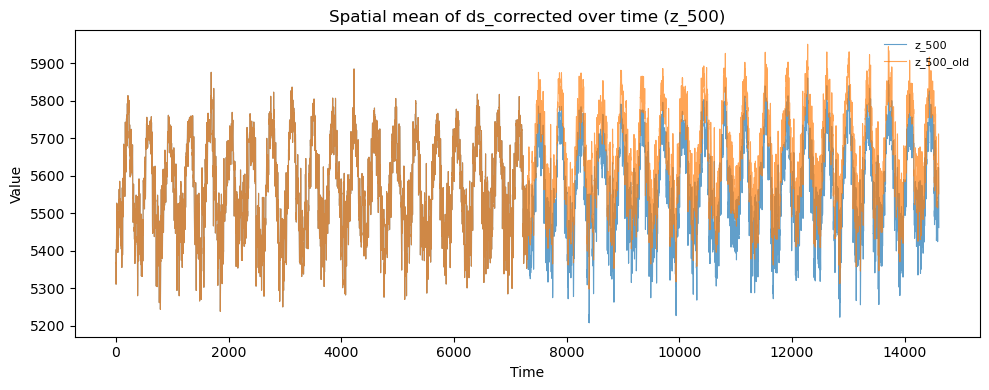

In [37]:
# spatial mean over lat/lon for each variable and plot over time
lr_mean = ds_final.to_array().mean(dim=("lat", "lon"))
lr_mean_old = lr_ds.to_array().mean(dim=("lat", "lon"))
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(lr_mean["time"])), lr_mean.sel(variable="z_500").values, label="z_500", lw=0.8, alpha=0.7)
ax.plot(np.arange(len(lr_mean_old["time"])), lr_mean_old.sel(variable="z_500").values, label="z_500_old", lw=0.8, alpha=0.7)
ax.set_title("Spatial mean of ds_corrected over time (z_500)")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

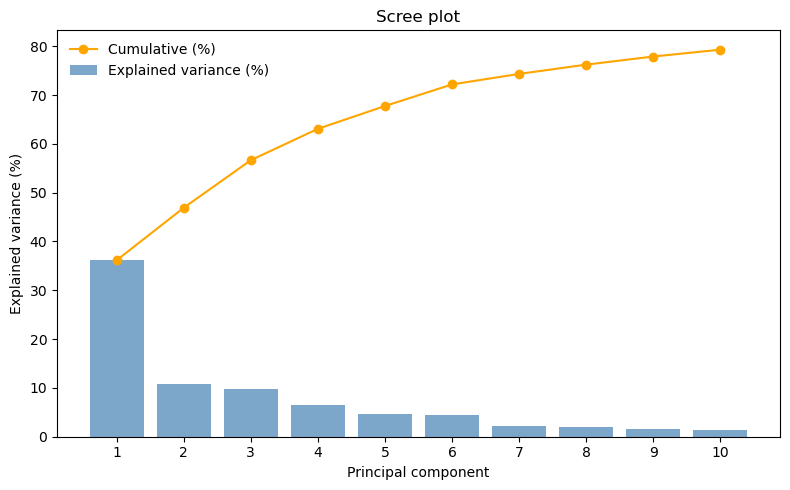

In [16]:
# Scree plot of PCA explained variance
evr = pca.explained_variance_ratio_
components = np.arange(1, evr.size + 1)

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(components, evr * 100, color="steelblue", alpha=0.7, label="Explained variance (%)")
ax.plot(components, np.cumsum(evr) * 100, color="orange", marker="o", label="Cumulative (%)")
ax.set_xlabel("Principal component")
ax.set_ylabel("Explained variance (%)")
ax.set_title("Scree plot")
ax.set_xticks(components)
ax.legend(loc="best", frameon=False)
plt.tight_layout()

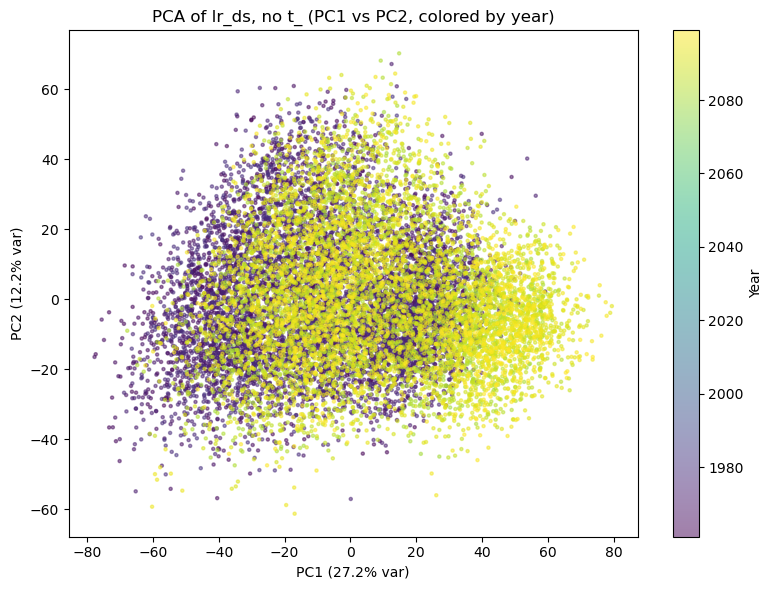

In [26]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Stack variables and spatial dims into features: (time, feature)
ds = lr_ds.drop_vars([k for k in lr_ds.data_vars if k.startswith("t_")])
da = ds.to_array().stack(feature=("variable", "lat", "lon")).transpose("time", "feature")
X = da.values  # shape: (n_time, n_features)

# Fill NaNs with feature means
feat_means = np.nanmean(X, axis=0)
nan_rows, nan_cols = np.where(np.isnan(X))
X[nan_rows, nan_cols] = feat_means[nan_cols]

# Standardize features and run PCA
X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=3, random_state=0)
pcs = pca.fit_transform(X_scaled)

# Color by year
years = lr_ds["time"].dt.year.values
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(pcs[:, 0], pcs[:, 1], c=years, s=5, cmap="viridis", alpha=0.5)
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_title("PCA of lr_ds, no t_ (PC1 vs PC2, colored by year)")
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Year")
plt.tight_layout()


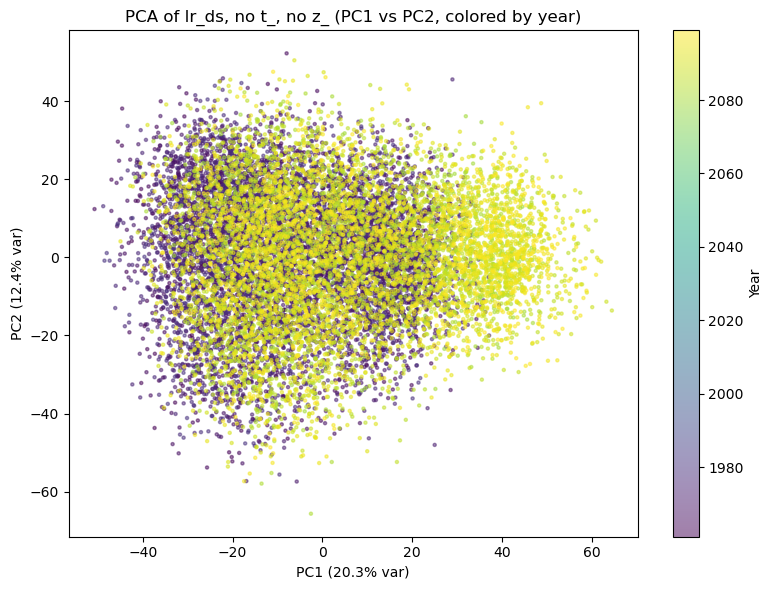

In [27]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Stack variables and spatial dims into features: (time, feature)
ds = lr_ds.drop_vars([k for k in lr_ds.data_vars if k.startswith("t_") or k.startswith("z_")])
da = ds.to_array().stack(feature=("variable", "lat", "lon")).transpose("time", "feature")
X = da.values  # shape: (n_time, n_features)

# Fill NaNs with feature means
feat_means = np.nanmean(X, axis=0)
nan_rows, nan_cols = np.where(np.isnan(X))
X[nan_rows, nan_cols] = feat_means[nan_cols]

# Standardize features and run PCA
X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=3, random_state=0)
pcs = pca.fit_transform(X_scaled)

# Color by year
years = lr_ds["time"].dt.year.values
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(pcs[:, 0], pcs[:, 1], c=years, s=5, cmap="viridis", alpha=0.5)
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_title("PCA of lr_ds, no t_, no z_ (PC1 vs PC2, colored by year)")
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Year")
plt.tight_layout()


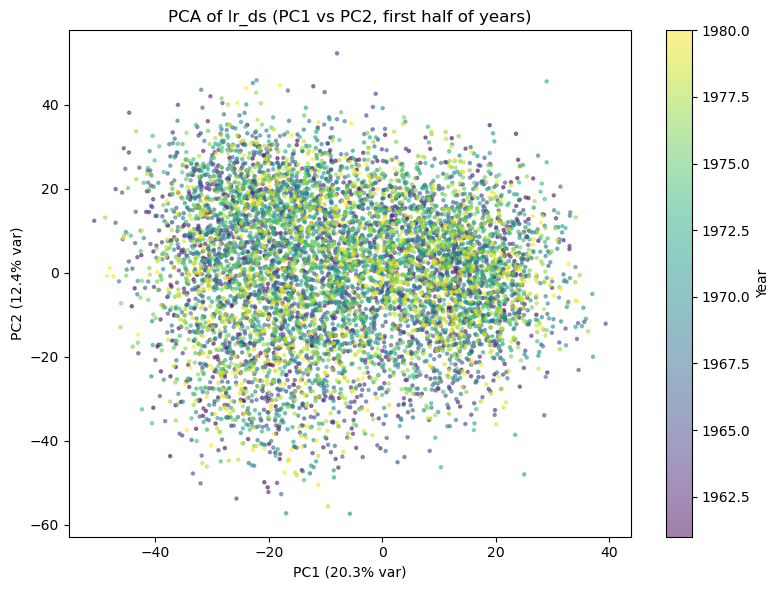

In [28]:
# plot only the first half of the years
unique_years = np.unique(years)
first_half_years = unique_years[:len(unique_years) // 2]
mask = np.isin(years, first_half_years)

fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(pcs[mask, 0], pcs[mask, 1], c=years[mask], s=5, cmap="viridis", alpha=0.5)
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_title("PCA of lr_ds (PC1 vs PC2, first half of years)")
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Year")
plt.tight_layout()

In [7]:
da

<xarray.DataArray (time: 14600, feature: 3840)> Size: 224MB
array([[8.1095390e+00, 9.3022327e+00, 1.0201848e+01, ..., 5.8184946e+03,
        5.8199580e+03, 5.8226714e+03],
       [6.2387800e+00, 8.0976171e+00, 9.3368740e+00, ..., 5.8198862e+03,
        5.8183506e+03, 5.8182241e+03],
       [4.9432673e+00, 6.5099988e+00, 7.6884537e+00, ..., 5.8157363e+03,
        5.8141943e+03, 5.8115688e+03],
       ...,
       [1.3282403e+01, 1.3244786e+01, 1.3091591e+01, ..., 5.9551631e+03,
        5.9486841e+03, 5.9426206e+03],
       [1.8795897e+01, 1.8011763e+01, 1.7575968e+01, ..., 5.9630459e+03,
        5.9590664e+03, 5.9574795e+03],
       [1.1229397e+01, 1.1564474e+01, 1.1730907e+01, ..., 5.9594829e+03,
        5.9625029e+03, 5.9684619e+03]], shape=(14600, 3840), dtype=float32)
Coordinates:
  * time      (time) datetime64[ns] 117kB 1961-01-01 1961-01-02 ... 2099-12-31
  * feature   (feature) object 31kB MultiIndex
  * variable  (feature) object 31kB 'u_850' 'u_850' 'u_850' ... 'z_500' 'z_500'
  * lat       (feature) float64 31kB -55.5 -55.5 -55.5 ... -25.5 -25.5 -25.5
  * lon       (feature) float64 31kB 157.5 159.5 161.5 ... 183.5 185.5 187.5
Attributes: (12/259)
    CDI:                  Climate Data Interface version 1.9.5 (http://mpimet...
    history:              Tue Jun 17 10:30:52 2025: cdo -L -mergetime -daymea...
    source:               CSIRO conformal-cubic model. Input file: ccam_12km....
    Conventions:          CF-1.7
    title:                CCAM simulation data
    contact:              ccam@csiro.au
    ...                   ...
    ateb_minsnowden:      100.0
    ateb_ncyits:          6
    ateb_nfgits:          3
    ateb_nrefl:           3
    ateb_refheight:       0.6
    ateb_resmeth:         1

In [32]:
lr_mean

<xarray.DataArray (variable: 15, time: 14600)> Size: 876kB
array([[6.6494255e+00, 5.4642258e+00, 4.8785577e+00, ..., 5.2349505e+00,
        6.5891347e+00, 6.7847857e+00],
       [9.9598312e+00, 8.9567413e+00, 8.4283304e+00, ..., 7.6469402e+00,
        8.9956379e+00, 9.3398838e+00],
       [1.5362951e+01, 1.4782682e+01, 1.3888935e+01, ..., 1.1842325e+01,
        1.2912571e+01, 1.3173080e+01],
       ...,
       [1.4233416e+03, 1.4540000e+03, 1.4614669e+03, ..., 1.5329457e+03,
        1.5295231e+03, 1.5144642e+03],
       [2.9840742e+03, 3.0184229e+03, 3.0347607e+03, ..., 3.1557920e+03,
        3.1584617e+03, 3.1426743e+03],
       [5.5756011e+03, 5.6134668e+03, 5.6422871e+03, ..., 5.8565381e+03,
        5.8688687e+03, 5.8530039e+03]], shape=(15, 14600), dtype=float32)
Coordinates:
  * time      (time) datetime64[ns] 117kB 1961-01-01 1961-01-02 ... 2099-12-31
  * variable  (variable) object 120B 'u_850' 'u_700' 'u_500' ... 'z_700' 'z_500'

In [33]:
hr_mean

<xarray.DataArray (variable: 2, time: 14600)> Size: 234kB
array([[  3.85789291,   1.54759434,   1.81599946, ...,   0.48685099,
          1.27314261,   5.9099027 ],
       [288.8568381 , 289.15444834, 290.24656999, ..., 297.5987539 ,
        298.38401606, 298.4265469 ]], shape=(2, 14600))
Coordinates:
  * time      (time) datetime64[ns] 117kB 1961-01-01 1961-01-02 ... 2099-12-31
  * variable  (variable) object 16B 'pr' 'tasmax'

Linear model R^2 on all time steps: 0.965
Top predictors (by |coef|):
  t_850: 1.2310
  t_500: 0.8685
  t_700: -0.7504
  v_850: -0.2319
  u_500: 0.2048


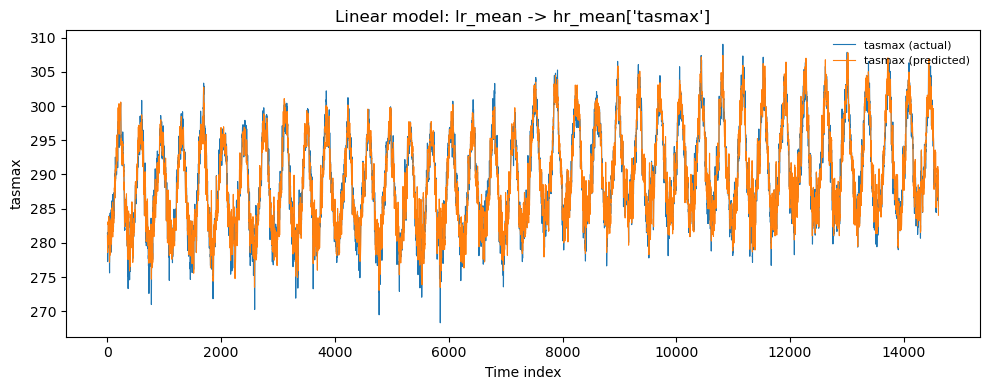

In [29]:
from sklearn.linear_model import LinearRegression

# Features: lr_mean variables over time -> shape (n_time, n_features)
X_feat = lr_mean.transpose("time", "variable").values
# Target: hr_mean tasmax over time -> shape (n_time,)
y_tas = hr_mean.sel(variable="tasmax").values

# Handle NaNs (fill features with per-feature means; target with overall mean)
feat_means_lr = np.nanmean(X_feat, axis=0)
rows, cols = np.where(np.isnan(X_feat))
if rows.size:
    X_feat[rows, cols] = feat_means_lr[cols]
if np.isnan(y_tas).any():
    y_tas = np.where(np.isnan(y_tas), np.nanmean(y_tas), y_tas)

# Train linear regression
lin = LinearRegression()
lin.fit(X_feat, y_tas)

# Evaluate and plot
y_pred = lin.predict(X_feat)
r2 = lin.score(X_feat, y_tas)
print(f"Linear model R^2 on all time steps: {r2:.3f}")

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(y_tas)), y_tas, label="tasmax (actual)", lw=0.8)
ax.plot(np.arange(len(y_pred)), y_pred, label="tasmax (predicted)", lw=0.8)
ax.set_title("Linear model: lr_mean -> hr_mean['tasmax']")
ax.set_xlabel("Time index")
ax.set_ylabel("tasmax")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

# Inspect top contributing predictors
var_names = lr_mean["variable"].values
coef = lin.coef_
top_idx = np.argsort(np.abs(coef))[::-1][:5]
print("Top predictors (by |coef|):")
for i in top_idx:
    print(f"  {var_names[i]}: {coef[i]:.4f}")

Linear model R^2 on all time steps: 0.971
Top predictors (by |coef|):
  t_850: 3.2285
  v_700: -1.0454
  t_500: -0.9295
  z_700: -0.7918
  u_700: -0.7246


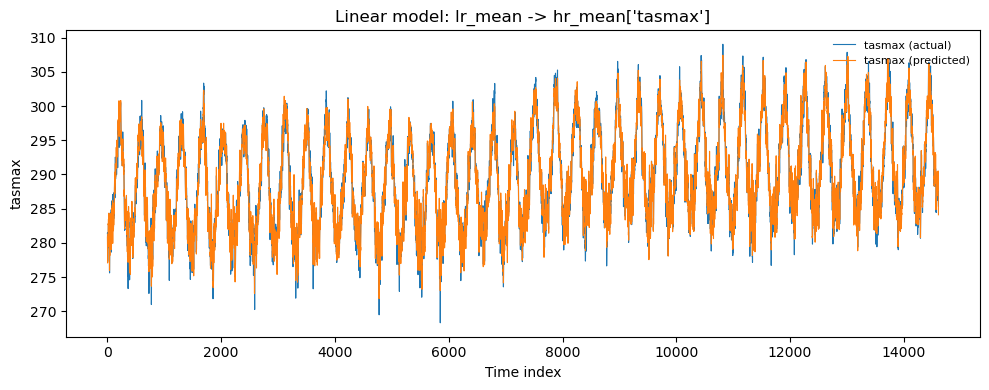

In [30]:
from sklearn.linear_model import LinearRegression

# Features: lr_mean variables over time -> shape (n_time, n_features)
X_feat = lr_mean.transpose("time", "variable").values
# Target: hr_mean tasmax over time -> shape (n_time,)
y_tas = hr_mean.sel(variable="tasmax").values

# Handle NaNs (fill features with per-feature means; target with overall mean)
feat_means_lr = np.nanmean(X_feat, axis=0)
rows, cols = np.where(np.isnan(X_feat))
if rows.size:
    X_feat[rows, cols] = feat_means_lr[cols]
if np.isnan(y_tas).any():
    y_tas = np.where(np.isnan(y_tas), np.nanmean(y_tas), y_tas)

# Train linear regression
X_feat_train = X_feat[:len(X_feat)//2]
y_tas_train = y_tas[:len(y_tas)//2]
lin = LinearRegression()
lin.fit(X_feat_train, y_tas_train)

# Evaluate and plot
y_pred = lin.predict(X_feat)
r2 = lin.score(X_feat, y_tas)
print(f"Linear model R^2 on all time steps: {r2:.3f}")

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(y_tas)), y_tas, label="tasmax (actual)", lw=0.8)
ax.plot(np.arange(len(y_pred)), y_pred, label="tasmax (predicted)", lw=0.8)
ax.set_title("Linear model: lr_mean -> hr_mean['tasmax']")
ax.set_xlabel("Time index")
ax.set_ylabel("tasmax")
ax.legend(loc="upper right", fontsize=8, frameon=False)
plt.tight_layout()

# Inspect top contributing predictors
var_names = lr_mean["variable"].values
coef = lin.coef_
top_idx = np.argsort(np.abs(coef))[::-1][:5]
print("Top predictors (by |coef|):")
for i in top_idx:
    print(f"  {var_names[i]}: {coef[i]:.4f}")

In [31]:
# Compute predictor means for first and last 20 years using existing mask
X_first20_mean = X_feat[mask].mean(axis=0)
X_last20_mean = X_feat[~mask].mean(axis=0)

# Predict tasmax mean from averaged predictors
tasmax_pred_first20 = lin.predict(X_first20_mean[None, :])[0]
tasmax_pred_last20 = lin.predict(X_last20_mean[None, :])[0]

# Actual tasmax means for comparison
tasmax_actual_first20 = hr_mean.sel(variable="tasmax").values[mask].mean()
tasmax_actual_last20 = hr_mean.sel(variable="tasmax").values[~mask].mean()

print(f"Predicted tasmax mean (first 20 years): {tasmax_pred_first20:.3f}")
print(f"Actual tasmax mean (first 20 years):    {tasmax_actual_first20:.3f}")
print(f"Predicted tasmax mean (last 20 years):  {tasmax_pred_last20:.3f}")
print(f"Actual tasmax mean (last 20 years):     {tasmax_actual_last20:.3f}")

Predicted tasmax mean (first 20 years): 287.357
Actual tasmax mean (first 20 years):    287.356
Predicted tasmax mean (last 20 years):  291.741
Actual tasmax mean (last 20 years):     291.729


### Mean shifts in target

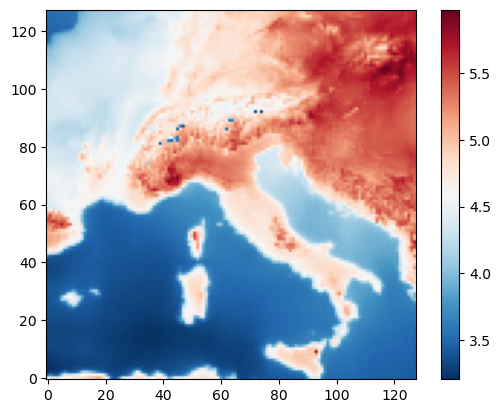

In [41]:
hr_ds = xr.open_dataset(hr_path)
mid = hr_ds["time"].size // 2
plt.imshow(hr_ds["tasmax"].values[mid:].mean(axis=(0)) - hr_ds["tasmax"].values[:mid].mean(axis=(0)), cmap="RdBu_r",origin="lower");
plt.colorbar()

## Visualise data

In [10]:
import torch 
import xarray as xr
import os
import matplotlib.pyplot as plt
import numpy as np

In [11]:
root="/r/scratch/users/mschillinger/data/cordexbench/"
domain="ALPS"
training_experiment = 'Emulator_hist_future'
mode = "train" 
if mode == "train":
    folder = "train"
else:
    raise ValueError("In DownscalingDatasetNormed: mode not recognised")
        
if training_experiment == 'ESD_pseudo_reality':
    period_training = '1961-1980'
elif training_experiment == 'Emulator_hist_future':
    period_training = '1961-1980_2080-2099'
else:
    raise ValueError('Provide a valid date')

# Set the GCM
if domain == 'ALPS':
    gcm_name = 'CNRM-CM5'
elif domain == 'NZ' or domain == 'SA':
    gcm_name = 'ACCESS-CM2'
DATA_PATH = root + f"/{domain}/{domain}_domain"
hr_path = f'{DATA_PATH}/{folder}/{training_experiment}/target/pr_tasmax_{gcm_name}_{period_training}.nc'
hr_ds = xr.open_dataset(hr_path)

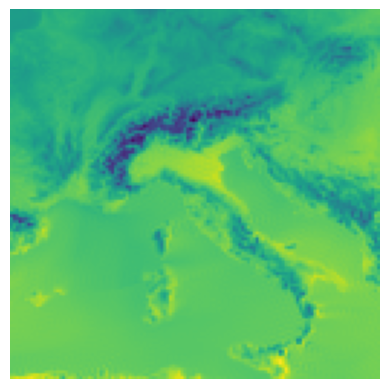

In [11]:
plt.imshow(hr_ds["tasmax"].isel(time=900), origin="lower"); plt.axis("off");

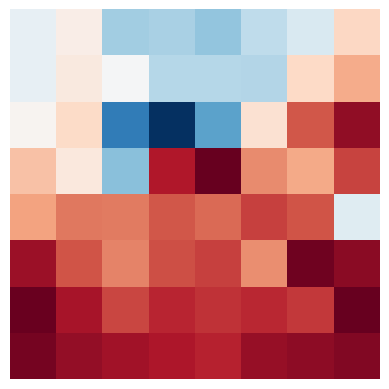

In [14]:
from torch.nn.functional import avg_pool2d
hr_pooled = avg_pool2d(torch.tensor(hr_ds["tasmax"].isel(time=900).values[None, None, ...]), kernel_size=16).squeeze().numpy()
plt.imshow(hr_pooled, origin="lower", cmap="RdBu_r"); plt.axis("off");

In [ ]:
lr_path = f'{DATA_PATH}/{folder}/{training_experiment}/predictors/{gcm_name}_{period_training}.nc'
lr_ds = xr.open_dataset(lr_path).astype("float32")
lr_ds

<xarray.Dataset> Size: 225MB
Dimensions:  (time: 14610, lat: 16, lon: 16)
Coordinates:
  * time     (time) datetime64[ns] 117kB 1961-01-01T12:00:00 ... 2099-12-31T1...
  * lon      (lon) float64 128B -4.0 -2.0 0.0 2.0 4.0 ... 20.0 22.0 24.0 26.0
  * lat      (lat) float64 128B 32.0 34.0 36.0 38.0 40.0 ... 56.0 58.0 60.0 62.0
Data variables: (12/15)
    u_850    (time, lat, lon) float32 15MB 5.404 5.786 5.58 ... -6.233 -6.644
    u_700    (time, lat, lon) float32 15MB 8.109 8.254 8.038 ... -1.614 -3.902
    u_500    (time, lat, lon) float32 15MB 12.04 12.14 12.07 ... 10.8 4.837
    v_850    (time, lat, lon) float32 15MB 1.269 1.057 0.62 ... 2.236 -0.7769
    v_700    (time, lat, lon) float32 15MB -3.097 -2.035 -0.55 ... -3.979 -2.639
    v_500    (time, lat, lon) float32 15MB -1.308 -0.2567 ... -18.53 -12.14
    ...       ...
    t_850    (time, lat, lon) float32 15MB 275.9 274.6 274.4 ... 259.2 258.4
    t_700    (time, lat, lon) float32 15MB 267.5 267.7 268.2 ... 253.5 252.0
    t_500    (time, lat, lon) float32 15MB 250.0 250.0 250.1 ... 240.4 238.0
    z_850    (time, lat, lon) float32 15MB 1.52e+03 1.519e+03 ... 1.439e+03
    z_700    (time, lat, lon) float32 15MB 3.066e+03 3.064e+03 ... 2.891e+03
    z_500    (time, lat, lon) float32 15MB 5.622e+03 5.622e+03 ... 5.306e+03
Attributes: (12/28)
    CDI:                            Climate Data Interface version 2.4.4 (htt...
    Conventions:                    CF-1.6
    institution:                    CNRM (Centre National de Recherches Meteo...
    description:                    Created by xios
    title:                          Created by xios
    creation_date:                  2020-03-01T12:29:46Z
    ...                             ...
    driving_experiment_comment:     Known issue correction: this simulation (...
    frequency:                      day
    tracking_id:                    hdl:21.14103/73d0f2aa-dfec-4e02-955f-b707...
    comment:                        CORDEX Europe EUR-11 CNRM-ALADIN 6.3 L91 ...
    history:                        Fri Jun 27 04:41:41 2025: cdo remap,/gpfs...
    CDO:                            Climate Data Operators version 2.4.4 (htt...

In [5]:
lr_path = f'{DATA_PATH}/{folder}/{training_experiment}/predictors/{gcm_name}_{period_training}.nc'
lr_ds = xr.open_dataset(lr_path).astype("float32")
lr_ds

<xarray.Dataset> Size: 225MB
Dimensions:  (time: 14610, lat: 16, lon: 16)
Coordinates:
  * time     (time) datetime64[ns] 117kB 1961-01-01T12:00:00 ... 2099-12-31T1...
  * lon      (lon) float64 128B -4.0 -2.0 0.0 2.0 4.0 ... 20.0 22.0 24.0 26.0
  * lat      (lat) float64 128B 32.0 34.0 36.0 38.0 40.0 ... 56.0 58.0 60.0 62.0
Data variables: (12/15)
    u_850    (time, lat, lon) float32 15MB 5.404 5.786 5.58 ... -6.233 -6.644
    u_700    (time, lat, lon) float32 15MB 8.109 8.254 8.038 ... -1.614 -3.902
    u_500    (time, lat, lon) float32 15MB 12.04 12.14 12.07 ... 10.8 4.837
    v_850    (time, lat, lon) float32 15MB 1.269 1.057 0.62 ... 2.236 -0.7769
    v_700    (time, lat, lon) float32 15MB -3.097 -2.035 -0.55 ... -3.979 -2.639
    v_500    (time, lat, lon) float32 15MB -1.308 -0.2567 ... -18.53 -12.14
    ...       ...
    t_850    (time, lat, lon) float32 15MB 275.9 274.6 274.4 ... 259.2 258.4
    t_700    (time, lat, lon) float32 15MB 267.5 267.7 268.2 ... 253.5 252.0
    t_500    (time, lat, lon) float32 15MB 250.0 250.0 250.1 ... 240.4 238.0
    z_850    (time, lat, lon) float32 15MB 1.52e+03 1.519e+03 ... 1.439e+03
    z_700    (time, lat, lon) float32 15MB 3.066e+03 3.064e+03 ... 2.891e+03
    z_500    (time, lat, lon) float32 15MB 5.622e+03 5.622e+03 ... 5.306e+03
Attributes: (12/28)
    CDI:                            Climate Data Interface version 2.4.4 (htt...
    Conventions:                    CF-1.6
    institution:                    CNRM (Centre National de Recherches Meteo...
    description:                    Created by xios
    title:                          Created by xios
    creation_date:                  2020-03-01T12:29:46Z
    ...                             ...
    driving_experiment_comment:     Known issue correction: this simulation (...
    frequency:                      day
    tracking_id:                    hdl:21.14103/73d0f2aa-dfec-4e02-955f-b707...
    comment:                        CORDEX Europe EUR-11 CNRM-ALADIN 6.3 L91 ...
    history:                        Fri Jun 27 04:41:41 2025: cdo remap,/gpfs...
    CDO:                            Climate Data Operators version 2.4.4 (htt...

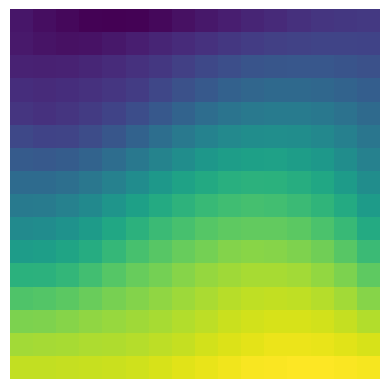

In [10]:
plt.imshow(lr_ds["z_500"].isel(time=0), origin="lower"); plt.axis("off");

## Trends in past data for target

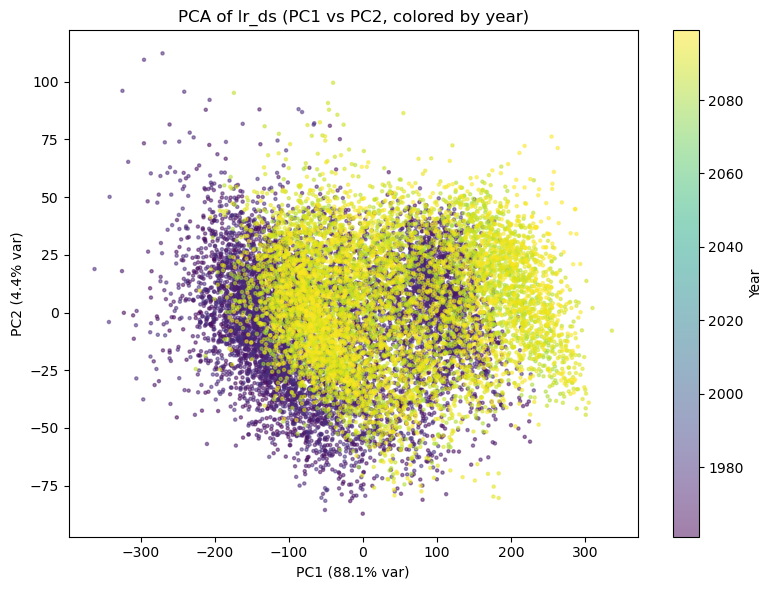

In [60]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Stack variables and spatial dims into features: (time, feature)
da = hr_ds["tasmax"].stack(feature=("y", "x")).transpose("time", "feature")
X = da.values  # shape: (n_time, n_features)

# Standardize features and run PCA
X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=3, random_state=0)
pcs = pca.fit_transform(X_scaled)

# Color by year
years = lr_ds["time"].dt.year.values
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(pcs[:, 0], pcs[:, 1], c=years, s=5, cmap="viridis", alpha=0.5)
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_title("PCA of lr_ds (PC1 vs PC2, colored by year)")
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Year")
plt.tight_layout()

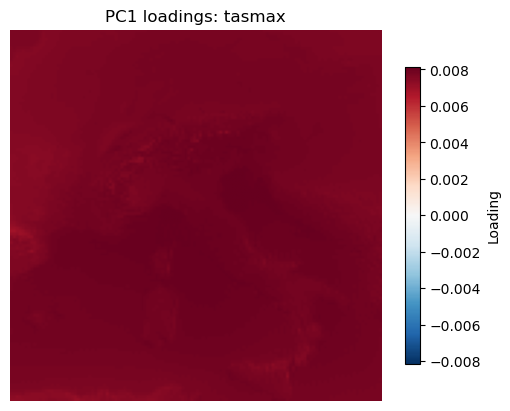

In [63]:
# Visualize spatial loadings of PC1 for tasmax only
pc1 = xr.DataArray(pca.components_[0], coords={"feature": da["feature"]}, dims=["feature"]).unstack("feature")

vmax = float(np.nanmax(np.abs(pc1.values)))
fig, ax = plt.subplots(figsize=(6, 4), constrained_layout=True)
im = ax.imshow(pc1, cmap="RdBu_r", origin="lower", vmin=-vmax, vmax=vmax)
ax.set_title("PC1 loadings: tasmax")
ax.axis("off")
fig.colorbar(im, ax=ax, shrink=0.8, label="Loading")
plt.show()

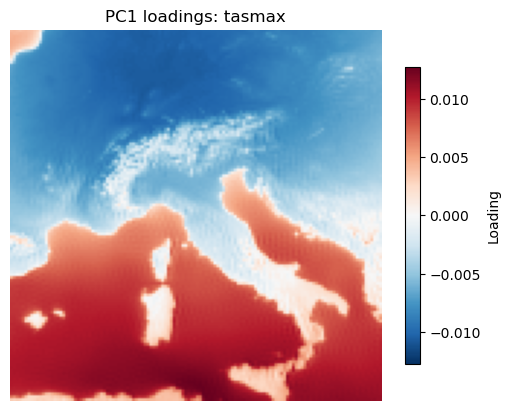

In [64]:
# Visualize spatial loadings of PC1 for tasmax only
pc2 = xr.DataArray(pca.components_[1], coords={"feature": da["feature"]}, dims=["feature"]).unstack("feature")

vmax = float(np.nanmax(np.abs(pc2.values)))
fig, ax = plt.subplots(figsize=(6, 4), constrained_layout=True)
im = ax.imshow(pc2, cmap="RdBu_r", origin="lower", vmin=-vmax, vmax=vmax)
ax.set_title("PC1 loadings: tasmax")
ax.axis("off")
fig.colorbar(im, ax=ax, shrink=0.8, label="Loading")
plt.show()

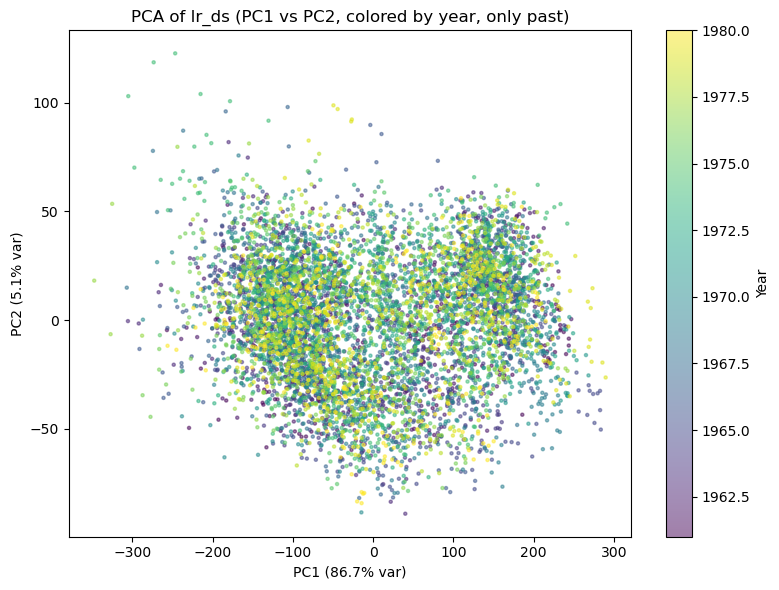

In [67]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Stack variables and spatial dims into features: (time, feature)
da = hr_ds["tasmax"].stack(feature=("y", "x")).transpose("time", "feature")
mid = len(da) // 2
X = da.values[:mid]  # shape: (n_time, n_features)

# Fill NaNs with feature means
feat_means = np.nanmean(X, axis=0)
nan_rows, nan_cols = np.where(np.isnan(X))
X[nan_rows, nan_cols] = feat_means[nan_cols]

# Standardize features and run PCA
X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=3, random_state=0)
pcs = pca.fit_transform(X_scaled)

# Color by year
years = lr_ds["time"].dt.year.values[:mid]
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(pcs[:, 0], pcs[:, 1], c=years, s=5, cmap="viridis", alpha=0.5)
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_title("PCA of lr_ds (PC1 vs PC2, colored by year, only past)")
cb = plt.colorbar(sc, ax=ax)
cb.set_label("Year")
plt.tight_layout()

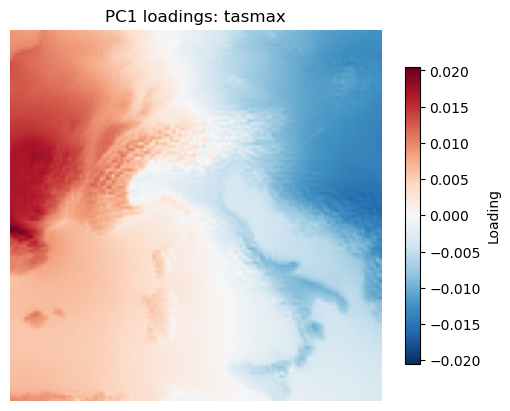

In [70]:
# Visualize spatial loadings of PC1 for tasmax only
pc2 = xr.DataArray(pca.components_[2], coords={"feature": da["feature"]}, dims=["feature"]).unstack("feature")

vmax = float(np.nanmax(np.abs([pc2])))
fig, ax = plt.subplots(figsize=(6, 4), constrained_layout=True)
im = ax.imshow(pc2, cmap="RdBu_r", origin="lower", vmin=-vmax, vmax=vmax)
ax.set_title("PC1 loadings: tasmax")
ax.axis("off")
fig.colorbar(im, ax=ax, shrink=0.8, label="Loading")
plt.show()


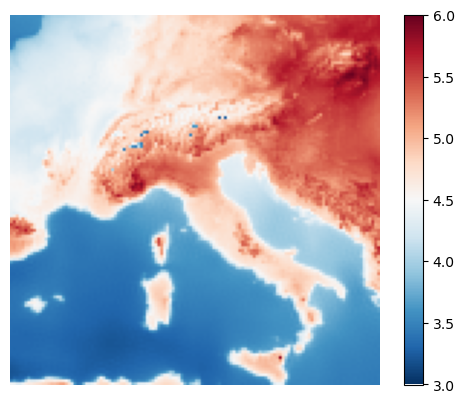

In [15]:
quarter = len(hr_ds.time) // 4
plt.imshow(hr_ds["tasmax"].values[mid:].mean(axis=0) - hr_ds["tasmax"].values[:mid].mean(axis=0), origin="lower", cmap="RdBu_r", vmin=3, vmax=6);
plt.axis("off");
plt.colorbar();

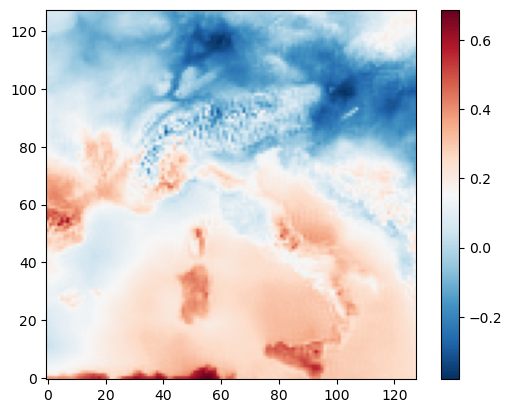

In [75]:
quarter = len(hr_ds.time) // 4
plt.imshow(hr_ds["tasmax"].values[quarter:mid].mean(axis=0) - hr_ds["tasmax"].values[:quarter].mean(axis=0), origin="lower", cmap="RdBu_r");
plt.colorbar()

## Precipitation in SA

In [2]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

In [3]:
root="/r/scratch/users/mschillinger/data/cordexbench/"
domain="SA"
training_experiment = 'Emulator_hist_future'
mode = "train" 
if mode == "train":
    folder = "train"
else:
    raise ValueError("In DownscalingDatasetNormed: mode not recognised")
        
if training_experiment == 'ESD_pseudo_reality':
    period_training = '1961-1980'
elif training_experiment == 'Emulator_hist_future':
    period_training = '1961-1980_2080-2099'
else:
    raise ValueError('Provide a valid date')

# Set the GCM
if domain == 'ALPS':
    gcm_name = 'CNRM-CM5'
elif domain == 'NZ' or domain == 'SA':
    gcm_name = 'ACCESS-CM2'
DATA_PATH = root + f"/{domain}/{domain}_domain"
hr_path = f'{DATA_PATH}/{folder}/{training_experiment}/target/pr_tasmax_{gcm_name}_{period_training}.nc'

In [4]:
hr_ds = xr.open_dataset(hr_path)

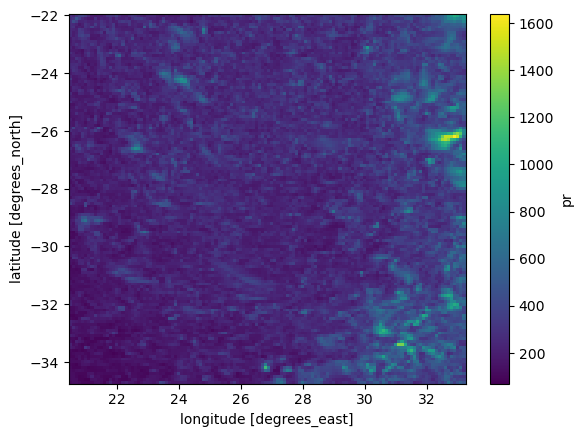

In [5]:
hr_ds.max(dim="time")["pr"].plot(cmap="viridis")

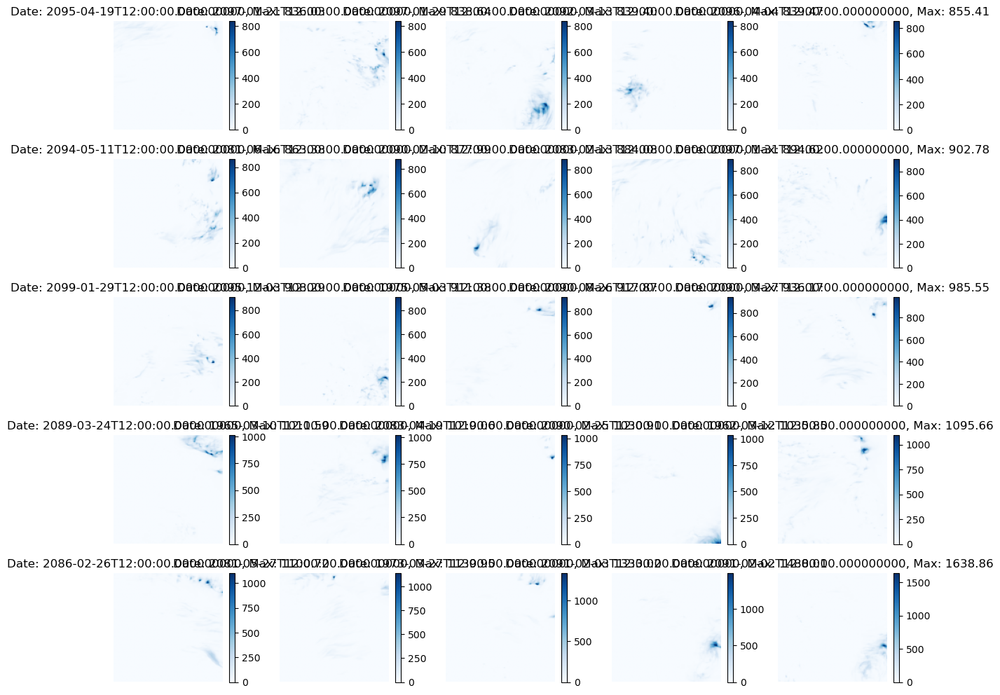

In [6]:
# Find the time indices with highest precipitation
top_n = 25
pr_max = hr_ds["pr"].max(dim=("lat", "lon"))
top_indices = pr_max.argsort()[-top_n:].values

# Plot the top precipitation days
fig, axes = plt.subplots(5, 5, figsize=(12, 10))
axes = axes.flatten()

for i, idx in enumerate(top_indices):
    fig = axes[i].imshow(hr_ds["pr"].isel(time=idx), cmap="Blues")
    date = hr_ds["time"].isel(time=idx).values
    axes[i].set_title(f"Date: {date}, Max: {pr_max.isel(time=idx).values:.2f}")
    axes[i].axis("off")
    plt.colorbar(fig, ax=axes[i])

plt.tight_layout()

# Check lengths

In [13]:
import torch 
import xarray as xr
import os
import matplotlib.pyplot as plt
import numpy as np

In [25]:
root="/r/scratch/users/mschillinger/data/cordexbench/"
domain="NZ"
training_experiment = 'Emulator_hist_future'
mode = "train" 
if mode == "train":
    folder = "train"
else:
    raise ValueError("In DownscalingDatasetNormed: mode not recognised")
        
if training_experiment == 'ESD_pseudo_reality':
    period_training = '1961-1980'
elif training_experiment == 'Emulator_hist_future':
    period_training = '1961-1980_2080-2099'
else:
    raise ValueError('Provide a valid date')

# Set the GCM
if domain == 'ALPS':
    gcm_name = 'CNRM-CM5'
elif domain == 'NZ' or domain == 'SA':
    gcm_name = 'ACCESS-CM2'
DATA_PATH = root + f"/{domain}/{domain}_domain"
hr_path = f'{DATA_PATH}/{folder}/{training_experiment}/target/pr_tasmax_{gcm_name}_{period_training}.nc'

In [26]:
hr_ds = xr.open_dataset(hr_path)
hr_ds

<xarray.Dataset> Size: 3GB
Dimensions:  (time: 14600, lat: 128, lon: 128)
Coordinates:
  * time     (time) datetime64[ns] 117kB 1961-01-01 1961-01-02 ... 2099-12-31
  * lon      (lon) float32 512B 166.0 166.1 166.3 166.4 ... 179.5 179.6 179.7
  * lat      (lat) float32 512B -47.56 -47.46 -47.35 ... -34.15 -34.04 -33.93
Data variables:
    pr       (time, lat, lon) float64 2GB ...
    tasmax   (time, lat, lon) float32 957MB ...
Attributes: (12/28)
    CDI:             Climate Data Interface version 1.9.5 (http://mpimet.mpg....
    history:         Tue Mar 12 14:54:26 2024: cdo merge /nesi/project/niwa00...
    source:          CSIRO conformal-cubic model. Input file: surf.ccam_12km....
    Conventions:     CF-1.7
    title:           CCAM simulation data
    il:              288
    ...              ...
    BC_version:      no output bias correction
    CMOR_v:          v1.0 Public
    CDO_call:        daymean computed on hourly data
    project:         NIWA CMIP6 Downscaling
    contact:         Peter Gibson (peter.gibson@niwa.co.nz)
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

In [27]:
# Check if hr_ds.time contains February 29th
feb29_mask = (hr_ds["time"].dt.month == 2) & (hr_ds["time"].dt.day == 29)
feb29_count = feb29_mask.sum().item()

print(f"Number of Feb 29th dates in hr_ds.time: {feb29_count}")
if feb29_count > 0:
    print("Feb 29th dates found:")
    print(hr_ds["time"].where(feb29_mask, drop=True).values)
else:
    print("No Feb 29th dates found in hr_ds.time")

Number of Feb 29th dates in hr_ds.time: 0
No Feb 29th dates found in hr_ds.time


In [28]:
lr_path = f'{DATA_PATH}/{folder}/{training_experiment}/predictors/{gcm_name}_{period_training}.nc'
lr_ds = xr.open_dataset(lr_path).astype("float32")
lr_ds

<xarray.Dataset> Size: 224MB
Dimensions:  (time: 14600, lat: 16, lon: 16)
Coordinates:
  * lon      (lon) float64 128B 157.5 159.5 161.5 163.5 ... 183.5 185.5 187.5
  * lat      (lat) float64 128B -55.5 -53.5 -51.5 -49.5 ... -29.5 -27.5 -25.5
  * time     (time) datetime64[ns] 117kB 1961-01-01 1961-01-02 ... 2099-12-31
Data variables: (12/15)
    u_850    (time, lat, lon) float32 15MB 8.11 9.302 10.2 ... -9.315 -9.562
    u_700    (time, lat, lon) float32 15MB 7.54 8.932 10.55 ... -7.361 -7.061
    u_500    (time, lat, lon) float32 15MB 12.62 11.78 12.47 ... -7.561 -9.616
    v_850    (time, lat, lon) float32 15MB 6.026 5.84 5.395 ... -0.7705 -0.4288
    v_700    (time, lat, lon) float32 15MB 4.61 5.1 4.402 ... -1.185 -0.9904
    v_500    (time, lat, lon) float32 15MB 8.158 8.447 6.162 ... -3.52 -4.031
    ...       ...
    t_850    (time, lat, lon) float32 15MB 268.9 269.2 269.2 ... 290.8 290.3
    t_700    (time, lat, lon) float32 15MB 260.7 260.7 260.6 ... 284.6 285.0
    t_500    (time, lat, lon) float32 15MB 244.9 243.8 243.2 ... 268.3 268.3
    z_850    (time, lat, lon) float32 15MB 1.259e+03 1.248e+03 ... 1.6e+03
    z_700    (time, lat, lon) float32 15MB 2.767e+03 2.758e+03 ... 3.243e+03
    z_500    (time, lat, lon) float32 15MB 5.259e+03 5.243e+03 ... 5.968e+03
Attributes: (12/259)
    CDI:                  Climate Data Interface version 1.9.5 (http://mpimet...
    history:              Tue Jun 17 10:30:52 2025: cdo -L -mergetime -daymea...
    source:               CSIRO conformal-cubic model. Input file: ccam_12km....
    Conventions:          CF-1.7
    title:                CCAM simulation data
    contact:              ccam@csiro.au
    ...                   ...
    ateb_minsnowden:      100.0
    ateb_ncyits:          6
    ateb_nfgits:          3
    ateb_nrefl:           3
    ateb_refheight:       0.6
    ateb_resmeth:         1

In [29]:
# Check if hr_ds.time contains February 29th
feb29_mask = (lr_ds["time"].dt.month == 2) & (lr_ds["time"].dt.day == 29)
feb29_count = feb29_mask.sum().item()

print(f"Number of Feb 29th dates in hr_ds.time: {feb29_count}")
if feb29_count > 0:
    print("Feb 29th dates found:")
    print(hr_ds["time"].where(feb29_mask, drop=True).values)
else:
    print("No Feb 29th dates found in hr_ds.time")

Number of Feb 29th dates in hr_ds.time: 0
No Feb 29th dates found in hr_ds.time


# Check predictor ordering

In [4]:
import torch 
import xarray as xr
import os
import matplotlib.pyplot as plt
import numpy as np

In [5]:
root="/r/scratch/users/mschillinger/data/cordexbench/"
domain="NZ"
training_experiment = 'Emulator_hist_future'
mode = "train" 
if mode == "train":
    folder = "train"
else:
    raise ValueError("In DownscalingDatasetNormed: mode not recognised")
        
if training_experiment == 'ESD_pseudo_reality':
    period_training = '1961-1980'
elif training_experiment == 'Emulator_hist_future':
    period_training = '1961-1980_2080-2099'
else:
    raise ValueError('Provide a valid date')

# Set the GCM
if domain == 'ALPS':
    gcm_name = 'CNRM-CM5'
elif domain == 'NZ' or domain == 'SA':
    gcm_name = 'ACCESS-CM2'
DATA_PATH = root + f"/{domain}/{domain}_domain"
hr_path = f'{DATA_PATH}/{folder}/{training_experiment}/target/pr_tasmax_{gcm_name}_{period_training}.nc'

In [6]:
lr_path = f'{DATA_PATH}/{folder}/{training_experiment}/predictors/{gcm_name}_{period_training}.nc'
lr_ds = xr.open_dataset(lr_path).astype("float32")
lr_ds

<xarray.Dataset> Size: 224MB
Dimensions:  (time: 14600, lat: 16, lon: 16)
Coordinates:
  * lon      (lon) float64 128B 157.5 159.5 161.5 163.5 ... 183.5 185.5 187.5
  * lat      (lat) float64 128B -55.5 -53.5 -51.5 -49.5 ... -29.5 -27.5 -25.5
  * time     (time) datetime64[ns] 117kB 1961-01-01 1961-01-02 ... 2099-12-31
Data variables: (12/15)
    u_850    (time, lat, lon) float32 15MB 8.11 9.302 10.2 ... -9.315 -9.562
    u_700    (time, lat, lon) float32 15MB 7.54 8.932 10.55 ... -7.361 -7.061
    u_500    (time, lat, lon) float32 15MB 12.62 11.78 12.47 ... -7.561 -9.616
    v_850    (time, lat, lon) float32 15MB 6.026 5.84 5.395 ... -0.7705 -0.4288
    v_700    (time, lat, lon) float32 15MB 4.61 5.1 4.402 ... -1.185 -0.9904
    v_500    (time, lat, lon) float32 15MB 8.158 8.447 6.162 ... -3.52 -4.031
    ...       ...
    t_850    (time, lat, lon) float32 15MB 268.9 269.2 269.2 ... 290.8 290.3
    t_700    (time, lat, lon) float32 15MB 260.7 260.7 260.6 ... 284.6 285.0
    t_500    (time, lat, lon) float32 15MB 244.9 243.8 243.2 ... 268.3 268.3
    z_850    (time, lat, lon) float32 15MB 1.259e+03 1.248e+03 ... 1.6e+03
    z_700    (time, lat, lon) float32 15MB 2.767e+03 2.758e+03 ... 3.243e+03
    z_500    (time, lat, lon) float32 15MB 5.259e+03 5.243e+03 ... 5.968e+03
Attributes: (12/259)
    CDI:                  Climate Data Interface version 1.9.5 (http://mpimet...
    history:              Tue Jun 17 10:30:52 2025: cdo -L -mergetime -daymea...
    source:               CSIRO conformal-cubic model. Input file: ccam_12km....
    Conventions:          CF-1.7
    title:                CCAM simulation data
    contact:              ccam@csiro.au
    ...                   ...
    ateb_minsnowden:      100.0
    ateb_ncyits:          6
    ateb_nfgits:          3
    ateb_nrefl:           3
    ateb_refheight:       0.6
    ateb_resmeth:         1

In [7]:
lr_ds.data_vars

Data variables:
    u_850    (time, lat, lon) float32 15MB 8.11 9.302 10.2 ... -9.315 -9.562
    u_700    (time, lat, lon) float32 15MB 7.54 8.932 10.55 ... -7.361 -7.061
    u_500    (time, lat, lon) float32 15MB 12.62 11.78 12.47 ... -7.561 -9.616
    v_850    (time, lat, lon) float32 15MB 6.026 5.84 5.395 ... -0.7705 -0.4288
    v_700    (time, lat, lon) float32 15MB 4.61 5.1 4.402 ... -1.185 -0.9904
    v_500    (time, lat, lon) float32 15MB 8.158 8.447 6.162 ... -3.52 -4.031
    q_850    (time, lat, lon) float32 15MB 0.002864 0.002752 ... 0.006236
    q_700    (time, lat, lon) float32 15MB 0.001149 0.00117 ... 0.0009148
    q_500    (time, lat, lon) float32 15MB 0.0003558 0.0002806 ... 0.0002835
    t_850    (time, lat, lon) float32 15MB 268.9 269.2 269.2 ... 290.8 290.3
    t_700    (time, lat, lon) float32 15MB 260.7 260.7 260.6 ... 284.6 285.0
    t_500    (time, lat, lon) float32 15MB 244.9 243.8 243.2 ... 268.3 268.3
    z_850    (time, lat, lon) float32 15MB 1.259e+03 1.248e

# Check mid century interence for ALPS

In [1]:
import torch 
import xarray as xr
import os
import matplotlib.pyplot as plt
import numpy as np

In [2]:
root="/r/scratch/users/mschillinger/data/cordexbench/"
domain="ALPS"
training_experiment = 'Emulator_hist_future'
mode = "train" 
if mode == "train":
    folder = "train"
else:
    raise ValueError("In DownscalingDatasetNormed: mode not recognised")
        
if training_experiment == 'ESD_pseudo_reality':
    period_training = '1961-1980'
elif training_experiment == 'Emulator_hist_future':
    period_training = '1961-1980_2080-2099'
else:
    raise ValueError('Provide a valid date')

# Set the GCM
if domain == 'ALPS':
    gcm_name = 'CNRM-CM5'
elif domain == 'NZ' or domain == 'SA':
    gcm_name = 'ACCESS-CM2'
DATA_PATH = root + f"/{domain}/{domain}_domain"
hr_path = f'{DATA_PATH}/{folder}/{training_experiment}/target/pr_tasmax_{gcm_name}_{period_training}.nc'

In [3]:
lr_path = f'{DATA_PATH}/{folder}/{training_experiment}/predictors/{gcm_name}_{period_training}.nc'
lr_ds = xr.open_dataset(lr_path).astype("float32")
lr_ds

<xarray.Dataset> Size: 225MB
Dimensions:  (time: 14610, lat: 16, lon: 16)
Coordinates:
  * time     (time) datetime64[ns] 117kB 1961-01-01T12:00:00 ... 2099-12-31T1...
  * lon      (lon) float64 128B -4.0 -2.0 0.0 2.0 4.0 ... 20.0 22.0 24.0 26.0
  * lat      (lat) float64 128B 32.0 34.0 36.0 38.0 40.0 ... 56.0 58.0 60.0 62.0
Data variables: (12/15)
    u_850    (time, lat, lon) float32 15MB 5.404 5.786 5.58 ... -6.233 -6.644
    u_700    (time, lat, lon) float32 15MB 8.109 8.254 8.038 ... -1.614 -3.902
    u_500    (time, lat, lon) float32 15MB 12.04 12.14 12.07 ... 10.8 4.837
    v_850    (time, lat, lon) float32 15MB 1.269 1.057 0.62 ... 2.236 -0.7769
    v_700    (time, lat, lon) float32 15MB -3.097 -2.035 -0.55 ... -3.979 -2.639
    v_500    (time, lat, lon) float32 15MB -1.308 -0.2567 ... -18.53 -12.14
    ...       ...
    t_850    (time, lat, lon) float32 15MB 275.9 274.6 274.4 ... 259.2 258.4
    t_700    (time, lat, lon) float32 15MB 267.5 267.7 268.2 ... 253.5 252.0
    t_500    (time, lat, lon) float32 15MB 250.0 250.0 250.1 ... 240.4 238.0
    z_850    (time, lat, lon) float32 15MB 1.52e+03 1.519e+03 ... 1.439e+03
    z_700    (time, lat, lon) float32 15MB 3.066e+03 3.064e+03 ... 2.891e+03
    z_500    (time, lat, lon) float32 15MB 5.622e+03 5.622e+03 ... 5.306e+03
Attributes: (12/28)
    CDI:                            Climate Data Interface version 2.4.4 (htt...
    Conventions:                    CF-1.6
    institution:                    CNRM (Centre National de Recherches Meteo...
    description:                    Created by xios
    title:                          Created by xios
    creation_date:                  2020-03-01T12:29:46Z
    ...                             ...
    driving_experiment_comment:     Known issue correction: this simulation (...
    frequency:                      day
    tracking_id:                    hdl:21.14103/73d0f2aa-dfec-4e02-955f-b707...
    comment:                        CORDEX Europe EUR-11 CNRM-ALADIN 6.3 L91 ...
    history:                        Fri Jun 27 04:41:41 2025: cdo remap,/gpfs...
    CDO:                            Climate Data Operators version 2.4.4 (htt...

In [5]:
test_params = {
    "period": "mid_century",
    "framework": "perfect",
    "gcm": "CNRM-CM5"
}
period_inference = "2041-2060"
lr_path = f'{DATA_PATH}/test/{test_params["period"]}/predictors/{test_params["framework"]}/{test_params["gcm"]}_{period_inference}.nc'
lr_ds_inference = xr.open_dataset(lr_path).astype("float32")

In [6]:
lr_ds_inference

<xarray.Dataset> Size: 112MB
Dimensions:  (time: 7305, lat: 16, lon: 16)
Coordinates:
  * time     (time) datetime64[ns] 58kB 2041-01-01T12:00:00 ... 2060-12-31T12...
  * lon      (lon) float64 128B -4.0 -2.0 0.0 2.0 4.0 ... 20.0 22.0 24.0 26.0
  * lat      (lat) float64 128B 32.0 34.0 36.0 38.0 40.0 ... 56.0 58.0 60.0 62.0
Data variables: (12/15)
    u_850    (time, lat, lon) float32 7MB 4.195 5.215 4.235 ... 3.324 2.383
    u_700    (time, lat, lon) float32 7MB 8.585 7.181 6.161 ... 5.645 4.784
    u_500    (time, lat, lon) float32 7MB 13.63 11.35 9.345 ... 11.67 10.87
    v_850    (time, lat, lon) float32 7MB 2.409 2.901 1.674 ... 7.039 5.7 2.626
    v_700    (time, lat, lon) float32 7MB 3.213 3.419 2.896 ... 1.278 0.7635
    v_500    (time, lat, lon) float32 7MB -0.3112 -1.567 ... -2.561 -1.997
    ...       ...
    t_850    (time, lat, lon) float32 7MB 282.2 282.0 283.2 ... 265.1 264.1
    t_700    (time, lat, lon) float32 7MB 276.9 276.8 276.6 ... 257.5 256.9
    t_500    (time, lat, lon) float32 7MB 259.3 259.2 259.0 ... 242.4 241.8
    z_850    (time, lat, lon) float32 7MB 1.575e+03 1.577e+03 ... 1.37e+03
    z_700    (time, lat, lon) float32 7MB 3.167e+03 3.172e+03 ... 2.853e+03
    z_500    (time, lat, lon) float32 7MB 5.814e+03 5.817e+03 ... 5.311e+03
Attributes: (12/28)
    CDI:                            Climate Data Interface version 2.4.4 (htt...
    Conventions:                    CF-1.6
    institution:                    CNRM (Centre National de Recherches Meteo...
    description:                    Created by xios
    title:                          Created by xios
    creation_date:                  2020-03-25T07:16:15Z
    ...                             ...
    c3s_disclaimer:                 This data has been produced in the contex...
    driving_experiment_comment:     Known issue correction: this simulation (...
    frequency:                      day
    tracking_id:                    hdl:21.14103/9994a924-f176-4908-b4a5-79dd...
    history:                        Fri Jun 27 04:24:34 2025: cdo remap,/gpfs...
    CDO:                            Climate Data Operators version 2.4.4 (htt...

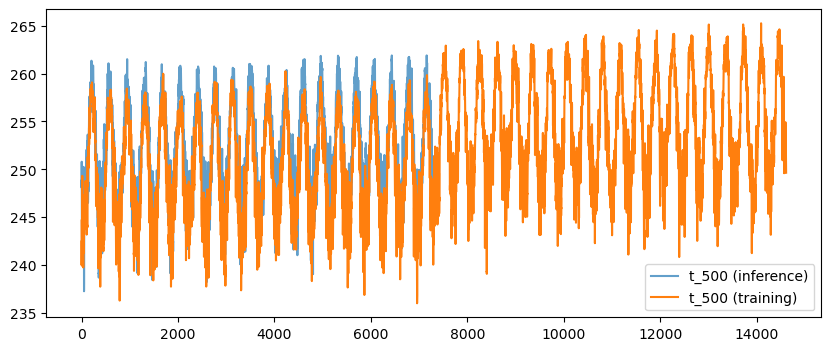

In [9]:
plt.figure(figsize=(10, 4))
plt.plot(lr_ds_inference["t_500"].values.mean(axis=(1,2)), alpha =0.7, label="t_500 (inference)");
plt.plot(lr_ds["t_500"].values.mean(axis=(1,2)), label="t_500 (training)");
plt.legend()